# **Proyecto Integrador: Avance 6**  

## **Integrantes**
Ana Cristina Torres Cordero | A00831285  
Irene Plascencia Villalobos | A01625258  
Jorge Santana Mendoza | A01376306  

### **Fecha de entrega:** 14 de Junio del 2026

# **Introducción**

Durante esta etapa del proyecto se desarrolló un pipeline para la identificación automática de productos presentes en escenas de retail utilizando modelos de visión por computadora. El objetivo principal fue construir una metodología capaz de detectar productos, segmentarlos, identificar su categoría y generar automáticamente información que posteriormente pueda utilizarse para el entrenamiento de modelos especializados.

La propuesta integra diferentes herramientas complementarias. En primer lugar, Grounding DINO se utiliza para localizar objetos candidatos dentro de las imágenes. Posteriormente, SAM2 permite obtener segmentaciones precisas de cada producto detectado. A partir de estas regiones segmentadas, DINOv2 extrae características visuales que son comparadas contra una memoria de referencia construida previamente a partir de imágenes etiquetadas de productos conocidos.

Con base en estas comparaciones, el sistema asigna una categoría a cada objeto detectado y genera predicciones a nivel de escena. Finalmente, las segmentaciones y clasificaciones obtenidas se utilizan para construir automáticamente un conjunto de pseudo-etiquetas en formato YOLO-Seg, permitiendo entrenar un modelo de detección y segmentación específico para el problema planteado.

En este documento se describe la implementación del pipeline, las etapas de procesamiento desarrolladas, los resultados obtenidos durante la identificación de productos y la generación del conjunto de datos utilizado para el entrenamiento del modelo baseline basado en YOLO.

## **Librerías**

In [10]:
import os
import re
import gc
import cv2
import json
import yaml
import torch
import pickle
import math
import torchvision
import random
import shutil
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.patches as patches

from PIL import Image
from glob import glob
from tqdm import tqdm

from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import PCA

from transformers import (
    AutoProcessor,
    AutoModelForZeroShotObjectDetection,
    AutoImageProcessor,
    AutoModel
)

from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

#from ultralytics import YOLO

In [ ]:
#pip install sam2
#pip install transformers
#pip install -q transformers accelerate timm
#pip install -q opencv-python pycocotools
#pip install -q scikit-learn pandas tqdm
#pip install ultralytics

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## **Paths**  
Se definen todos los paths a utilizar en el notebook.

In [125]:
LOCAL_OUT = "/content/outputs_temp"

path = '/content/drive/MyDrive/Pruebas_Proyecto_Integrador/Avance6_Equipo18'

EMBEDDINGS_DIR = os.path.join(LOCAL_OUT, "object_embeddings")
MASKS_DIR = os.path.join(LOCAL_OUT, "sam_masks")
OVERLAY_DIR = os.path.join(LOCAL_OUT, "masks_overlay_completo")
SEGMENTED_DIR = os.path.join(LOCAL_OUT, "crops_segmented")

REFERENCE_IMAGES_DIR = '/content/drive/MyDrive/Proyecto_Integrador/Proyecto Integrador/reference images'
SCENES_DIR = '/content/drive/MyDrive/Proyecto_Integrador/Proyecto Integrador/images'
COCO_JSON = '/content/drive/MyDrive/Proyecto_Integrador/Proyecto Integrador/_annotations.coco.json'
PRODUCT_CATALOG = '/content/drive/MyDrive/Proyecto_Integrador/Proyecto Integrador/product_catalog.csv'
SCENE_ANNOTATIONS = '/content/drive/MyDrive/Proyecto_Integrador/Proyecto Integrador/scene_annotations.csv'
#EMBEDDINGS_DIR = '/content/drive/MyDrive/TEC/MNA/Proyecto Integrador/object_embeddings'
#MASKS_DIR = '/content/drive/MyDrive/TEC/MNA/Proyecto Integrador/sam_masks'
#OVERLAY_DIR = '/content/drive/MyDrive/TEC/MNA/Proyecto Integrador/masks_overlay_completo'
#SEGMENTED_DIR = '/content/drive/MyDrive/TEC/MNA/Proyecto Integrador/crops_segmented'

for d in [
    LOCAL_OUT,
    EMBEDDINGS_DIR,
    MASKS_DIR,
    OVERLAY_DIR,
    SEGMENTED_DIR
]:
    os.makedirs(d, exist_ok=True)

# Guardar solo lo necesario
SAVE_MASKS = True          # necesario si luego harás YOLO-Seg
SAVE_CROPS = False         # pesado, solo para debug
SAVE_EMBEDDINGS = False    # pesado; puedes guardar embedding en parquet si quieres
SAVE_OVERLAYS = True       # útil para revisar, pero puedes limitarlo

SAVE_OVERLAY_EVERY = 10    # guarda overlay cada 10 imágenes
DEBUG_MAX_OVERLAYS = 50    # máximo overlays guardados

CHECKPOINT_EVERY = 25

# SAM2

SAM2_CONFIG = 'configs/sam2/sam2_hiera_l.yaml'
SAM2_CHECKPOINT = '/content/sam2_hiera_large.pt'

DEVICE = "cuda"
MAX_IMAGES = 807
# poner None para correr todo

In [4]:
!wget https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_large.pt

--2026-06-14 21:18:56--  https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_large.pt
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.173.161.39, 3.173.161.59, 3.173.161.45, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.173.161.39|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 897952466 (856M) [application/vnd.snesdev-page-table]
Saving to: ‘sam2_hiera_large.pt’

sam2_hiera_large.pt 100%[===================>] 856.35M   274MB/s    in 3.1s    

2026-06-14 21:18:59 (274 MB/s) - ‘sam2_hiera_large.pt’ saved [897952466/897952466]



## **Carga e Inicialización de Modelos**

### **Grounding DINO**  
Se carga el procesador y el modelo preentrenado Grounding DINO, especializado en detección de objetos guiada por texto. Esta configuración permite identificar regiones de interés dentro de las imágenes a partir de descripciones semánticas, proporcionando las cajas delimitadoras iniciales que serán utilizadas posteriormente en el proceso de segmentación y reconocimiento de productos.

In [5]:
#Grounding DINO
processor_dino_grounding = AutoProcessor.from_pretrained(
    "IDEA-Research/grounding-dino-base")

grounding_model = AutoModelForZeroShotObjectDetection.from_pretrained(
    "IDEA-Research/grounding-dino-base"
).to(DEVICE)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/457 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.74k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.24k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/933M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/1182 [00:00<?, ?it/s]

### **DINOv2 Large**  
Se carga el modelo DINOv2 junto con su procesador de imágenes para generar representaciones vectoriales de alto nivel a partir de los productos segmentados. Estos embeddings capturan características visuales relevantes como forma, textura y apariencia, permitiendo comparar objetos mediante métricas de similitud y construir una memoria de referencias para la identificación automática de SKU en escenas complejas.

In [6]:
#DINOv2
processor_dinov2 = AutoImageProcessor.from_pretrained(
    "facebook/dinov2-base"
)

dinov2 = AutoModel.from_pretrained(
    "facebook/dinov2-base"
).to(DEVICE)

dinov2.eval()

preprocessor_config.json:   0%|          | 0.00/436 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/223 [00:00<?, ?it/s]

Dinov2Model(
  (embeddings): Dinov2Embeddings(
    (patch_embeddings): Dinov2PatchEmbeddings(
      (projection): Conv2d(3, 768, kernel_size=(14, 14), stride=(14, 14))
    )
    (dropout): Dropout(p=0.0, inplace=False)
  )
  (encoder): Dinov2Encoder(
    (layer): ModuleList(
      (0-11): 12 x Dinov2Layer(
        (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attention): Dinov2Attention(
          (attention): Dinov2SelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
          )
          (output): Dinov2SelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.0, inplace=False)
          )
        )
        (layer_scale1): Dinov2LayerScale()
        (drop_path): Identity()
        (norm2): LayerNorm((768,), eps=1e-06,

### **SAM2**  
Se carga el modelo Segment Anything Model 2 (SAM2) junto con sus pesos preentrenados y la configuración correspondiente. Posteriormente, se crea un predictor que permite generar máscaras de segmentación a partir de regiones de interés proporcionadas por otros modelos de detección. Esta etapa es fundamental para obtener contornos precisos de los productos presentes en las escenas, facilitando la separación entre objetos y fondo para las fases posteriores de extracción de características y reconocimiento.

In [7]:
!git clone https://github.com/facebookresearch/sam2.git

Cloning into 'sam2'...
remote: Enumerating objects: 1107, done.
remote: Counting objects: 100% (18/18), done.
remote: Compressing objects: 100% (16/16), done.
remote: Total 1107 (delta 11), reused 2 (delta 2), pack-reused 1089 (from 2)
Receiving objects: 100% (1107/1107), 134.92 MiB | 41.35 MiB/s, done.
Resolving deltas: 100% (384/384), done.


In [8]:
%cd /content/sam2

!pip install -e

/content/sam2

Usage:   
  pip3 install [options] <requirement specifier> [package-index-options] ...
  pip3 install [options] -r <requirements file> [package-index-options] ...
  pip3 install [options] [-e] <vcs project url> ...
  pip3 install [options] [-e] <local project path> ...
  pip3 install [options] <archive url/path> ...

-e option requires 1 argument


In [9]:
!pip install hydra-core iopath -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 3.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.7/154.7 kB 13.3 MB/s eta 0:00:00


In [11]:
#SAM2
sam2_model = build_sam2(
    SAM2_CONFIG,
    SAM2_CHECKPOINT,
    device=DEVICE)

predictor = SAM2ImagePredictor(
    sam2_model)

print("SAM2 cargado")

SAM2 cargado


## **Catálogo de Productos**  
Se carga el archivo generado manualmente con el catálogo de productos que se verán en las escenas capturadas.

In [12]:
catalog = pd.read_csv(
    PRODUCT_CATALOG,
    encoding='latin1')

catalog.head()

,sku_id,product_name,category,shape_class,units_available,width_cm,depth_cm,height_cm,stackable,recommended_stack_orientation
0,SKU001,Mushrooms 180g,Can,can_small,16,7.0,7.0,7.5,yes,upright
1,SKU002,Mushrooms 380g,Can,can_medium,11,7.5,7.5,11.0,yes,upright
2,SKU003,Sardines 425g,Can,can_rect_flat,14,11.0,16.5,4.0,yes,upright
3,SKU004,Coconut cream 432 ml,Can,can_medium_tall,5,7.5,7.5,12.0,yes,upright
4,SKU005,Beverage can 350 ml,Can,can_tall,12,5.5,5.5,12.5,yes,upright


## **Construcción de Memoria de Referencia**

### **Prompt Textual para Detección de Objetos**  
Se construye automáticamente un prompt textual a partir de las categorías de forma registradas en el catálogo de productos. Estas descripciones son utilizadas por Grounding DINO para guiar el proceso de detección, permitiendo localizar objetos en las escenas mediante características visuales generales como latas, cajas o envases.

In [13]:
shape_classes = (
    catalog["shape_class"]
    .dropna()
    .unique()
    .tolist()
)

TEXT_PROMPT = ". ".join(
    shape_classes
)

print(TEXT_PROMPT)

can_small. can_medium. can_rect_flat. can_medium_tall. can_tall. can_flat. can_large. bag_large. bag_flat. bag_medium. pack_soft. pack_soft_large. carton_tall. box_long_flat. box_medium. box_small. box_small_flat. box_tiny_flat. carton_small. glass_jar_small. glass_jar_medium. plastic_jar_medium. plastic_jar_small. bar_rect


### **Función para la Extracción de Embeddings**  
Se define una función para generar embeddings visuales de los productos segmentados utilizando DINOv2. Los vectores obtenidos son normalizados para facilitar la comparación mediante similitud coseno y su posterior uso en la identificación de SKU.

In [14]:
def extract_embedding(rgb_crop):

    pil_image = Image.fromarray(
        rgb_crop
    )

    inputs = processor_dinov2(
        images=pil_image,
        return_tensors="pt"
    ).to(DEVICE)

    with torch.no_grad():

        features = dinov2(
            **inputs
        )

    emb = (
        features.last_hidden_state[:,0]
        .cpu()
        .numpy()
        .flatten()
    )

    emb = emb / (
        np.linalg.norm(emb) + 1e-8
    )

    return emb

### **Variaciones de Referencia**  
Se generan versiones aumentadas de cada imagen de referencia mediante transformaciones simples, incluyendo reflejo horizontal y ajustes de brillo. Esto permite aumentar la variabilidad visual de los ejemplos utilizados en la memoria de referencias y mejorar la robustez del proceso de identificación de SKU.

In [15]:
def generate_augmented_versions(img):

    versions = []

    versions.append(img)

    versions.append(
        cv2.flip(img,1)
    )

    versions.append(
        cv2.convertScaleAbs(
            img,
            alpha=1.15,
            beta=15
        )
    )

    versions.append(
        cv2.convertScaleAbs(
            img,
            alpha=0.85,
            beta=-15
        )
    )

    return versions

### **Carga de Anotaciones de Referencia**  
Se cargan las anotaciones del conjunto de datos en formato COCO, las cuales contienen la información de los SKU de referencia y sus metadatos asociados. Estas anotaciones son utilizadas posteriormente para construir la memoria visual y relacionar cada imagen con su categoría correspondiente.

In [16]:
with open(
    COCO_JSON,
    "r"
) as f:

    coco = json.load(f)

### **Creación de Estructuras de Consulta**  
Se generan diccionarios de consulta que permiten acceder de forma eficiente a la información de categorías e imágenes contenida en las anotaciones COCO. Estas estructuras facilitan la asociación entre identificadores, SKU y archivos de imagen durante la construcción de la memoria de referencia.

In [17]:
cat_map = {
    c["id"]: c["name"]
    for c in coco["categories"]
}

img_map = {
    img["id"]: img
    for img in coco["images"]
}

### **Construcción de la Memory Bank de Referencia**  
Se recorren las anotaciones COCO para extraer el recorte correspondiente a cada SKU de referencia. A cada recorte se le aplican aumentos visuales y se generan embeddings con DINOv2. Estos vectores se almacenan junto con su SKU para formar la memoria de referencia utilizada en la comparación por similitud coseno.

In [34]:
memory_bank = []

In [35]:
for ann in tqdm(coco["annotations"]):

    image_info = img_map[
        ann["image_id"]
    ]

    sku = cat_map[
        ann["category_id"]
    ]

    #################################################
    # AJUSTAR EXTENSION SI NECESARIO
    #################################################

    image_path = os.path.join(
        REFERENCE_IMAGES_DIR,
        image_info["file_name"]
        )

    image = cv2.imread(
        image_path
    )

    image = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )

    x,y,w,h = ann["bbox"]

    x = int(x)
    y = int(y)
    w = int(w)
    h = int(h)

    crop = image[
        y:y+h,
        x:x+w
    ]

    augmented = generate_augmented_versions(
        crop
    )

    for version in augmented:

        emb = extract_embedding(
            version
        )

        memory_bank.append({

            "sku": sku,

            "embedding": emb
        })

100%|██████████| 34/34 [00:06<00:00,  4.91it/s]


### **Almacenamiento**
Se guarda la memoria de referencia generada en un archivo serializado para su reutilización posterior. Esto permite cargar los embeddings de los SKU sin necesidad de reconstruir la memoria en cada ejecución del pipeline.

In [36]:
#Guardar en drive el memory bank .pkl de referencia (generado en este colab)
MEMORY_BANK_DRIVE = (
    "/content/drive/MyDrive/Pruebas_Proyecto_Integrador/Avance6_Equipo18/"
    "memory_bank_reference.pkl"
)

with open(MEMORY_BANK_DRIVE, "wb") as f:
    pickle.dump(memory_bank, f)

print("Guardado en:")
print(MEMORY_BANK_DRIVE)

Guardado en:
/content/drive/MyDrive/Pruebas_Proyecto_Integrador/Avance6_Equipo18/memory_bank_reference.pkl


In [37]:
#Guardar en drive el memory bank .csv de referencia (generado en este colab)
df_mb = pd.DataFrame([
    {
        "sku": x["sku"],
        "embedding_dim": len(x["embedding"])
    }
    for x in memory_bank
])

df_mb.to_csv(
    "/content/drive/MyDrive/Pruebas_Proyecto_Integrador/Avance6_Equipo18/memory_bank_reference.csv",
    index=False
)

In [38]:
#Homogenizar ambas memory banks
# Rutas
BASE_PKL = "/content/drive/MyDrive/Pruebas_Proyecto_Integrador/Avance6_Equipo18/memory_bank_reference.pkl"

NEW_PKL = "/content/drive/MyDrive/Pruebas_Proyecto_Integrador/memory_bank_clean.pkl"
NEW_CSV = "/content/drive/MyDrive/Pruebas_Proyecto_Integrador/memory_bank_clean.csv"

# Cargar
with open(BASE_PKL, "rb") as f:
    base_bank = pickle.load(f)

with open(NEW_PKL, "rb") as f:
    new_bank = pickle.load(f)

new_df = pd.read_csv(NEW_CSV)

print("BASE")
print(type(base_bank), len(base_bank))
print(base_bank[0].keys())
print("embedding dim:", len(base_bank[0]["embedding"]))

print("\nNUEVA")
print(type(new_bank), len(new_bank))
print(new_bank[0].keys())
print("embedding dim:", len(new_bank[0]["embedding"]))

print("\nCSV nueva")
print(new_df.shape)
print(new_df.columns.tolist())
display(new_df.head())

BASE
<class 'list'> 136
dict_keys(['sku', 'embedding'])
embedding dim: 768

NUEVA
<class 'list'> 1243
dict_keys(['image_name', 'scene_id', 'view_name', 'object_id', 'box', 'mask_area', 'embedding', 'pseudo_label', 'cluster_status', 'assigned_product', 'assigned_similarity', 'assignment_status', 'final_product', 'final_status', 'color_feature', 'pseudo_label_color'])
embedding dim: 768

CSV nueva
(1243, 7)
['image_name', 'scene_id', 'view_name', 'object_id', 'mask_area', 'final_product', 'final_status']


,image_name,scene_id,view_name,object_id,mask_area,final_product,final_status
0,SCN_116_A0_front.jpg,SCN_116,A0_front,0,95983,mushrooms_180g,trusted_cluster
1,SCN_116_A0_front.jpg,SCN_116,A0_front,7,106448,mushrooms_180g,trusted_cluster
2,SCN_115_A0_front.jpg,SCN_115,A0_front,0,73583,baby_food,accepted_round2
3,SCN_115_A0_front.jpg,SCN_115,A0_front,1,76586,baby_food,accepted_round2
4,SCN_115_A0_front.jpg,SCN_115,A0_front,2,259866,flour,accepted_round2


In [58]:
#Homologar etiquetas
product_to_sku = {
    "mushrooms_180g": "SKU001",
    "mushrooms_380g": "SKU002",
    "sardines": "SKU003",
    "coconut_cream": "SKU004",
    "beverage_can": "SKU005",
    "table_cream": "SKU006",
    "tuna": "SKU007",
    "jalapenos": "SKU008",
    "fruits_in_syrup": "SKU009",
    "vegetable_shortening": "SKU010",
    "rice": "SKU011",
    "salt": "SKU012",
    "femenine_pads": "SKU013",
    "feminine_pads": "SKU013",
    "flour": "SKU014",
    "baby_towel": "SKU015",
    "milk": "SKU016",
    "aluminium_foil": "SKU017",
    "aluminum_foil": "SKU017",
    "tomato_sauce": "SKU018",
    "drinking_chocolate": "SKU019",
    "baking_soda": "SKU020",
    "yeast": "SKU021",
    "instant_soup": "SKU022",
    "tea": "SKU023",
    "annatto": "SKU024",
    "matchbox": "SKU025",
    "juice": "SKU026",
    "baby_food": "SKU027",
    "olives": "SKU028",
    "mayonnaise": "SKU029",
    "hair_gel": "SKU030",
    "amica_ointment": "SKU031",
    "fragrance_air_freshener": "SKU032",
    "fragance_air_fresher": "SKU032",
    "soap": "SKU033"
}

In [65]:
#Convertir al mismo formato
new_df_keyed = new_df.set_index(["image_name", "object_id"])

new_bank_converted = []
missing_products = []

for item in new_bank:
    key = (item["image_name"], item["object_id"])

    if key not in new_df_keyed.index:
        continue

    product = new_df_keyed.loc[key]["final_product"]

    if product not in product_to_sku:
        missing_products.append(product)
        continue

    new_bank_converted.append({
        "sku": product_to_sku[product],
        "embedding": item["embedding"]
    })

print("Base:", len(base_bank))
print("Nueva original:", len(new_bank))
print("Nueva convertida:", len(new_bank_converted))
print("Productos sin homologar:", sorted(set(missing_products)))

Base: 136
Nueva original: 1243
Nueva convertida: 1243
Productos sin homologar: []


In [66]:
#Funcionamos ambas memorias
merged_bank = base_bank + new_bank_converted

print("Fusionada:", len(merged_bank))
print("SKUs únicos:", len(set([x["sku"] for x in merged_bank])))
print(sorted(set([x["sku"] for x in merged_bank])))

Fusionada: 1379
SKUs únicos: 33
['SKU001', 'SKU002', 'SKU003', 'SKU004', 'SKU005', 'SKU006', 'SKU007', 'SKU008', 'SKU009', 'SKU010', 'SKU011', 'SKU012', 'SKU013', 'SKU014', 'SKU015', 'SKU016', 'SKU017', 'SKU018', 'SKU019', 'SKU020', 'SKU021', 'SKU022', 'SKU023', 'SKU024', 'SKU025', 'SKU026', 'SKU027', 'SKU028', 'SKU029', 'SKU030', 'SKU031', 'SKU032', 'SKU033']


In [67]:
#Guardamos la nueva memoria
MERGED_PATH = "/content/drive/MyDrive/Pruebas_Proyecto_Integrador/Avance6_Equipo18/memory_bank_merged_768.pkl"

with open(MERGED_PATH, "wb") as f:
    pickle.dump(merged_bank, f)

print("Memory bank fusionada guardada en:")
print(MERGED_PATH)

Memory bank fusionada guardada en:
/content/drive/MyDrive/Pruebas_Proyecto_Integrador/Avance6_Equipo18/memory_bank_merged_768.pkl


In [70]:
#Confirmar que se homologaron bien
print("Etiquetas base:")
for x in sorted(set([item["sku"] for item in base_bank])):
    print(x)

print("\nEtiquetas fusionadas:")
for x in sorted(set([item["sku"] for item in merged_bank])):
    print(x)

Etiquetas base:
SKU001
SKU002
SKU003
SKU004
SKU005
SKU006
SKU007
SKU008
SKU009
SKU010
SKU011
SKU012
SKU013
SKU014
SKU015
SKU016
SKU017
SKU018
SKU019
SKU020
SKU021
SKU022
SKU023
SKU024
SKU025
SKU026
SKU027
SKU028
SKU029
SKU030
SKU031
SKU032
SKU033

Etiquetas fusionadas:
SKU001
SKU002
SKU003
SKU004
SKU005
SKU006
SKU007
SKU008
SKU009
SKU010
SKU011
SKU012
SKU013
SKU014
SKU015
SKU016
SKU017
SKU018
SKU019
SKU020
SKU021
SKU022
SKU023
SKU024
SKU025
SKU026
SKU027
SKU028
SKU029
SKU030
SKU031
SKU032
SKU033


In [73]:
#Verificaciones
print("\nTotal SKUs base:", len(set([x["sku"] for x in base_bank])))
print("Total SKUs fusionados:", len(set([x["sku"] for x in merged_bank])))

fusionados = sorted(set([x["sku"] for x in merged_bank]))
print(fusionados)


Total SKUs base: 33
Total SKUs fusionados: 33
['SKU001', 'SKU002', 'SKU003', 'SKU004', 'SKU005', 'SKU006', 'SKU007', 'SKU008', 'SKU009', 'SKU010', 'SKU011', 'SKU012', 'SKU013', 'SKU014', 'SKU015', 'SKU016', 'SKU017', 'SKU018', 'SKU019', 'SKU020', 'SKU021', 'SKU022', 'SKU023', 'SKU024', 'SKU025', 'SKU026', 'SKU027', 'SKU028', 'SKU029', 'SKU030', 'SKU031', 'SKU032', 'SKU033']


### **Carga de la Memory Bank de Referencia**  
Se carga la memoria de referencia previamente almacenada, recuperando los embeddings y SKU asociados para su utilización durante el proceso de identificación de productos mediante similitud visual.

In [18]:
with open(
    "/content/drive/MyDrive/Pruebas_Proyecto_Integrador/Avance6_Equipo18/memory_bank_merged_768.pkl",
    "rb"
) as f:

    memory_bank = pickle.load(f)

print("Memory bank cargada:", len(memory_bank))
print("Dimensión embedding:", len(memory_bank[0]["embedding"]))
print(memory_bank[0].keys())

Memory bank cargada: 1379
Dimensión embedding: 768
dict_keys(['sku', 'embedding'])


### **Preparación de Embeddings**  
Se organizan los embeddings y SKU almacenados en la memoria de referencia en estructuras independientes para facilitar el cálculo eficiente de similitudes y la recuperación del SKU más cercano durante el proceso de identificación de productos.

In [19]:
reference_embeddings = np.vstack(
    [
        x["embedding"]
        for x in memory_bank
    ]
)

reference_skus = [
    x["sku"]
    for x in memory_bank
]

In [20]:
print("Embeddings:", reference_embeddings.shape)
print("Labels:", len(reference_skus))
print("SKUs únicos:", len(set(reference_skus)))

for sku in sorted(set(reference_skus)):
    print(sku)

Embeddings: (1379, 768)
Labels: 1379
SKUs únicos: 33
SKU001
SKU002
SKU003
SKU004
SKU005
SKU006
SKU007
SKU008
SKU009
SKU010
SKU011
SKU012
SKU013
SKU014
SKU015
SKU016
SKU017
SKU018
SKU019
SKU020
SKU021
SKU022
SKU023
SKU024
SKU025
SKU026
SKU027
SKU028
SKU029
SKU030
SKU031
SKU032
SKU033


## **Selección de Escenas para Procesamiento**  
Se recopilan las imágenes de las escenas que serán analizadas y, de manera opcional, se limita la cantidad de imágenes a procesar para realizar pruebas controladas. Esto permite validar el funcionamiento del pipeline antes de ejecutarlo sobre el conjunto completo de datos.

In [126]:
scene_paths = sorted(
    glob(
        os.path.join(
            SCENES_DIR,
            "*")))

valid_views = (
    "_top.jpg",
    "_left.jpg",
    "_right.jpg")

#valid_views = (
#    "_top.jpg",
#    "_left.jpg")

scene_paths = [

    p for p in scene_paths

    if p.endswith(
        valid_views)]

if MAX_IMAGES is not None:

    scene_paths = scene_paths[
        :MAX_IMAGES]

print(
    "Escenas:",
    len(scene_paths))

Escenas: 807


## **Procesamiento Integral**  
Se procesa cada imagen de escena mediante un pipeline completo que combina Grounding DINO, SAM2 y DINOv2. Primero se detectan regiones candidatas de productos, se filtran cajas irrelevantes y se aplica NMS para reducir duplicados. Después, SAM2 genera máscaras precisas para cada objeto detectado, las cuales se guardan como máscaras binarias, recortes segmentados y overlays visuales de la escena.

Finalmente, cada producto segmentado se convierte en un embedding con DINOv2 y se compara contra la memory bank para asignar el SKU más similar, almacenando las predicciones, similitudes, cajas y rutas de embeddings para análisis posterior.

In [127]:
all_predictions = []

### Nuevo

In [128]:
import os
import shutil

# ==========================
# LIMPIAR OUTPUTS ANTES DE CORRER
# ==========================

LOCAL_OUT = "/content/outputs_temp"

MASKS_DIR = os.path.join(LOCAL_OUT, "sam_masks")
OVERLAY_DIR = os.path.join(LOCAL_OUT, "masks_overlay_completo")

# Borra TODO lo anterior
if os.path.exists(LOCAL_OUT):
    shutil.rmtree(LOCAL_OUT)

# Crea carpetas limpias
os.makedirs(MASKS_DIR, exist_ok=True)
os.makedirs(OVERLAY_DIR, exist_ok=True)

# Reiniciar predicciones
all_predictions = []

print("Carpetas limpias y all_predictions reiniciado.")

Carpetas limpias y all_predictions reiniciado.


In [129]:
with open(
    "/content/drive/MyDrive/Pruebas_Proyecto_Integrador/Avance6_Equipo18/memory_bank_merged_768.pkl",
    "rb"
) as f:
    memory_bank = pickle.load(f)

reference_embeddings = np.vstack([
    x["embedding"]
    for x in memory_bank
])

reference_skus = [
    x["sku"]
    for x in memory_bank
]

print("Total embeddings:", reference_embeddings.shape)
print("Total labels:", len(reference_skus))
print("Productos únicos:", len(set(reference_skus)))

Total embeddings: (1379, 768)
Total labels: 1379
Productos únicos: 33


In [130]:
# ==========================
# MATCHING AGRUPADO POR SKU
# ==========================

from collections import defaultdict
from sklearn.metrics.pairwise import cosine_similarity

sku_to_embeddings = defaultdict(list)

for sku, emb in zip(reference_skus, reference_embeddings):
    sku_to_embeddings[sku].append(emb)

for sku in sku_to_embeddings:
    sku_to_embeddings[sku] = np.vstack(sku_to_embeddings[sku])


def match_sku_grouped(emb, sku_to_embeddings, top_k=3):

    scores = []

    for sku, embs in sku_to_embeddings.items():

        sims = cosine_similarity(
            emb.reshape(1, -1),
            embs
        )[0]

        scores.append({
            "sku": sku,
            "score": float(np.max(sims))
        })

    scores = sorted(
        scores,
        key=lambda x: x["score"],
        reverse=True
    )

    best = scores[0]
    second = scores[1] if len(scores) > 1 else {"sku": None, "score": 0}

    return {
        "best_sku": best["sku"],
        "best_similarity": best["score"],
        "second_sku": second["sku"],
        "second_similarity": second["score"],
        "margin": best["score"] - second["score"],
        "top_k": scores[:top_k]
    }

In [131]:
# ==========================
# LOOP PRINCIPAL OPTIMIZADO
# ==========================

all_predictions = []

MIN_SIMILARITY = 0.50
MIN_MARGIN = 0.00

for scene_idx, scene_path in enumerate(tqdm(scene_paths)):

    scene_name = os.path.splitext(
        os.path.basename(scene_path)
    )[0]

    try:
        image = Image.open(scene_path).convert("RGB")
        image_np = np.array(image)

        # ==========================
        # GROUNDING DINO
        # ==========================

        inputs = processor_dino_grounding(
            images=image,
            text=TEXT_PROMPT,
            return_tensors="pt"
        ).to(DEVICE)

        with torch.no_grad():
            outputs = grounding_model(**inputs)

        results = processor_dino_grounding.post_process_grounded_object_detection(
            outputs=outputs,
            input_ids=inputs.input_ids,
            threshold=0.25,
            text_threshold=0.20,
            target_sizes=[image.size[::-1]]
        )[0]

        boxes = results["boxes"]
        scores = results["scores"]

        if len(boxes) == 0:
            del image, image_np, inputs, outputs, results
            gc.collect()
            if torch.cuda.is_available():
                torch.cuda.empty_cache()
            continue

        # ==========================
        # FILTRO POR ÁREA
        # ==========================

        img_w, img_h = image.size
        img_area = img_w * img_h

        filtered_boxes = []
        filtered_scores = []

        for box, score in zip(boxes, scores):

            x1, y1, x2, y2 = box.detach().cpu().numpy()

            area = (x2 - x1) * (y2 - y1)

            if area < 0.15 * img_area:
                filtered_boxes.append(box)
                filtered_scores.append(score)

        if len(filtered_boxes) == 0:
            del image, image_np, inputs, outputs, results
            gc.collect()
            if torch.cuda.is_available():
                torch.cuda.empty_cache()
            continue

        boxes = torch.stack(filtered_boxes)

        scores_tensor = torch.tensor(
            [float(x) for x in filtered_scores],
            device=boxes.device
        )

        keep = torchvision.ops.nms(
            boxes,
            scores_tensor,
            iou_threshold=0.4
        )

        boxes = boxes[keep]

        # ==========================
        # SAM2
        # ==========================

        predictor.set_image(image_np)

        scene_overlay = image_np.copy()

        colors = [
            [255, 0, 0],
            [0, 255, 0],
            [0, 0, 255],
            [255, 255, 0],
            [255, 0, 255],
            [0, 255, 255]
        ]

        for obj_idx, box in enumerate(boxes.detach().cpu().numpy()):

            masks, mask_scores, _ = predictor.predict(
                box=box,
                multimask_output=True
            )

            best_mask = masks[
                np.argmax(mask_scores)
            ]

            ys, xs = np.where(best_mask)

            if len(xs) < 10:
                del masks, mask_scores, best_mask
                continue

            # ==========================
            # OVERLAY DEBUG
            # ==========================

            should_save_overlay = (
                SAVE_OVERLAYS
                and scene_idx % SAVE_OVERLAY_EVERY == 0
                and scene_idx < DEBUG_MAX_OVERLAYS
            )

            if should_save_overlay:

                color = colors[
                    obj_idx % len(colors)
                ]

                scene_overlay[
                    best_mask > 0
                ] = (
                    0.5 * scene_overlay[best_mask > 0]
                    +
                    0.5 * np.array(color)
                ).astype(np.uint8)

                x1, y1, x2, y2 = map(int, box)

                cv2.rectangle(
                    scene_overlay,
                    (x1, y1),
                    (x2, y2),
                    (255, 255, 255),
                    3
                )

                cv2.putText(
                    scene_overlay,
                    str(obj_idx),
                    (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.8,
                    (255, 255, 255),
                    2
                )

            # ==========================
            # GUARDAR MÁSCARA
            # ==========================

            mask_path = None

            if SAVE_MASKS:

                mask_path = os.path.join(
                    MASKS_DIR,
                    f"{scene_name}_obj_{obj_idx}.png"
                )

                cv2.imwrite(
                    mask_path,
                    (best_mask * 255).astype(np.uint8)
                )

            # ==========================
            # CROP OPTIMIZADO EN RAM
            # ==========================

            y1m, y2m = ys.min(), ys.max()
            x1m, x2m = xs.min(), xs.max()

            crop_rgb = image_np[
                y1m:y2m,
                x1m:x2m
            ].copy()

            crop_mask = best_mask[
                y1m:y2m,
                x1m:x2m
            ]

            # Fondo blanco en vez de negro
            crop_rgb[
                crop_mask == 0
            ] = 255

            # ==========================
            # DINOv2 + MATCHING
            # ==========================

            emb = extract_embedding(
                crop_rgb
            )

            match = match_sku_grouped(
                emb,
                sku_to_embeddings
            )

            best_sku = match["best_sku"]
            best_similarity = match["best_similarity"]
            second_sku = match["second_sku"]
            second_similarity = match["second_similarity"]
            margin = match["margin"]

            # Filtro opcional de confianza
            if (
                best_similarity < MIN_SIMILARITY
                or margin < MIN_MARGIN
            ):
                del masks, mask_scores, best_mask, crop_rgb, crop_mask, emb
                continue

            all_predictions.append({
                "scene": os.path.basename(scene_path),
                "object_id": obj_idx,
                "predicted_sku": best_sku,
                "similarity": best_similarity,
                "second_sku": second_sku,
                "second_similarity": second_similarity,
                "similarity_margin": margin,
                "bbox_x1": float(box[0]),
                "bbox_y1": float(box[1]),
                "bbox_x2": float(box[2]),
                "bbox_y2": float(box[3]),
                "mask_path": mask_path
            })

            del masks, mask_scores, best_mask, crop_rgb, crop_mask, emb

        # ==========================
        # GUARDAR OVERLAY
        # ==========================

        should_save_overlay = (
            SAVE_OVERLAYS
            and scene_idx % SAVE_OVERLAY_EVERY == 0
            and scene_idx < DEBUG_MAX_OVERLAYS
        )

        if should_save_overlay:

            overlay_path = os.path.join(
                OVERLAY_DIR,
                f"{scene_name}.jpg"
            )

            cv2.imwrite(
                overlay_path,
                cv2.cvtColor(
                    scene_overlay,
                    cv2.COLOR_RGB2BGR
                ),
                [cv2.IMWRITE_JPEG_QUALITY, 80]
            )

        # ==========================
        # CHECKPOINT
        # ==========================

        if (
            scene_idx % CHECKPOINT_EVERY == 0
            and len(all_predictions) > 0
        ):

            checkpoint_df = pd.DataFrame(
                all_predictions
            )

            checkpoint_df.to_csv(
                os.path.join(
                    LOCAL_OUT,
                    "scene_predictions_checkpoint.csv"
                ),
                index=False
            )

        # ==========================
        # LIMPIEZA MEMORIA
        # ==========================

        del image, image_np, scene_overlay, inputs, outputs, results, boxes, scores

        gc.collect()

        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    except Exception as e:

        print(
            f"Error en {scene_path}: {e}"
        )

        gc.collect()

        if torch.cuda.is_available():
            torch.cuda.empty_cache()

        continue

# ==========================
# GUARDADO FINAL
# ==========================

results_df = pd.DataFrame(
    all_predictions
)

results_df = results_df.drop_duplicates(
    subset=[
        "scene",
        "object_id",
        "bbox_x1",
        "bbox_y1",
        "bbox_x2",
        "bbox_y2"
    ]
).reset_index(drop=True)

results_csv_path = os.path.join(
    LOCAL_OUT,
    "scene_predictions.csv"
)

results_parquet_path = os.path.join(
    LOCAL_OUT,
    "scene_predictions.parquet"
)

results_df.to_csv(
    results_csv_path,
    index=False
)

results_df.to_parquet(
    results_parquet_path,
    index=False
)

print("Predicciones guardadas en:")
print(results_csv_path)
print(results_parquet_path)
print("Total predicciones:", len(results_df))

100%|██████████| 807/807 [29:33<00:00,  2.20s/it]

Predicciones guardadas en:
/content/outputs_temp/scene_predictions.csv
/content/outputs_temp/scene_predictions.parquet
Total predicciones: 4054


### **Consolidación de Predicciones Generadas**  
Esta tabla reúne la información de cada objeto detectado, incluyendo el SKU asignado, la similitud obtenida, las coordenadas de la detección y la ubicación de su embedding, facilitando el análisis y la evaluación posterior del pipeline.

In [132]:
results_df = pd.DataFrame(
    all_predictions
)

results_df.head()

,scene,object_id,predicted_sku,similarity,second_sku,second_similarity,similarity_margin,bbox_x1,bbox_y1,bbox_x2,bbox_y2,mask_path
0,SCN_001_A1_left.jpg,0,SKU033,0.512771,SKU013,0.505675,0.007095,738.907043,2188.003174,1207.138306,2627.208496,/content/outputs_temp/sam_masks/SCN_001_A1_lef...
1,SCN_001_A1_left.jpg,2,SKU013,0.730746,SKU010,0.606020,0.124726,2367.677734,2072.687012,2759.634033,2509.321289,/content/outputs_temp/sam_masks/SCN_001_A1_lef...
2,SCN_001_A1_left.jpg,3,SKU013,0.634168,SKU010,0.550750,0.083418,1989.361328,2046.461914,2340.558350,2523.131592,/content/outputs_temp/sam_masks/SCN_001_A1_lef...
3,SCN_001_A2_right.jpg,0,SKU033,0.609563,SKU015,0.523104,0.086459,957.129578,2107.446289,1460.479614,2460.600830,/content/outputs_temp/sam_masks/SCN_001_A2_rig...
4,SCN_001_A2_right.jpg,1,SKU033,0.542051,SKU013,0.498464,0.043587,585.785339,2094.959961,1107.089844,2445.641113,/content/outputs_temp/sam_masks/SCN_001_A2_rig...


Se almacenan las predicciones generadas en formatos CSV y Parquet para facilitar su análisis, consulta y reutilización. Estos archivos contienen la información de los objetos detectados e identificados en las escenas, sirviendo como base para la evaluación de métricas y el entrenamiento de modelos posteriores.

In [133]:
#Guardar csv
results_df.to_csv(
    "scene_predictions.csv",
    index=False)

#Guardar parquet
results_df.to_parquet(
    "scene_predictions.parquet",
    index=False)

In [134]:
#Top detecciones
results_df.sort_values(
    "similarity",
    ascending=False
).head(20)

,scene,object_id,predicted_sku,similarity,second_sku,second_similarity,similarity_margin,bbox_x1,bbox_y1,bbox_x2,bbox_y2,mask_path
2572,SCN_169_A1_left.jpg,6,SKU005,0.971289,SKU007,0.557448,0.413841,1857.041870,1357.251099,2113.834473,1825.496948,/content/outputs_temp/sam_masks/SCN_169_A1_lef...
2410,SCN_160_A1_left.jpg,6,SKU005,0.970555,SKU007,0.522454,0.448101,1364.840576,1296.253418,1673.752197,1858.972168,/content/outputs_temp/sam_masks/SCN_160_A1_lef...
2579,SCN_169_A2_right.jpg,6,SKU005,0.969660,SKU007,0.535024,0.434636,1857.717163,1383.873535,2101.223633,1813.838989,/content/outputs_temp/sam_masks/SCN_169_A2_rig...
2767,SCN_184_A2_right.jpg,2,SKU005,0.969189,SKU007,0.538848,0.430341,1345.916260,1844.519287,1630.658569,2384.597168,/content/outputs_temp/sam_masks/SCN_184_A2_rig...
3568,SCN_236_A2_right.jpg,1,SKU005,0.968293,SKU007,0.549537,0.418756,2585.308105,1338.330811,2910.141846,1894.035645,/content/outputs_temp/sam_masks/SCN_236_A2_rig...
3442,SCN_229_A2_right.jpg,1,SKU009,0.967144,SKU008,0.614737,0.352407,2410.371094,1881.124756,2883.983643,2515.729004,/content/outputs_temp/sam_masks/SCN_229_A2_rig...
3546,SCN_235_A2_right.jpg,4,SKU005,0.967004,SKU007,0.528889,0.438115,2437.329102,1358.817993,2745.139893,1895.893433,/content/outputs_temp/sam_masks/SCN_235_A2_rig...
3895,SCN_259_A1_left.jpg,1,SKU002,0.966869,SKU001,0.921943,0.044926,1224.234375,1885.052490,1581.802124,2497.301514,/content/outputs_temp/sam_masks/SCN_259_A1_lef...
3194,SCN_213_A1_left.jpg,2,SKU005,0.966245,SKU007,0.555022,0.411224,1521.829712,1367.491211,1781.622314,1823.832642,/content/outputs_temp/sam_masks/SCN_213_A1_lef...
3720,SCN_248_A1_left.jpg,4,SKU002,0.964862,SKU001,0.924875,0.039987,2265.335449,1857.412109,2600.305664,2412.515625,/content/outputs_temp/sam_masks/SCN_248_A1_lef...


### **Distribución de Similitudes**  
Se visualiza la distribución de los valores de similitud coseno obtenidos durante la identificación de productos.

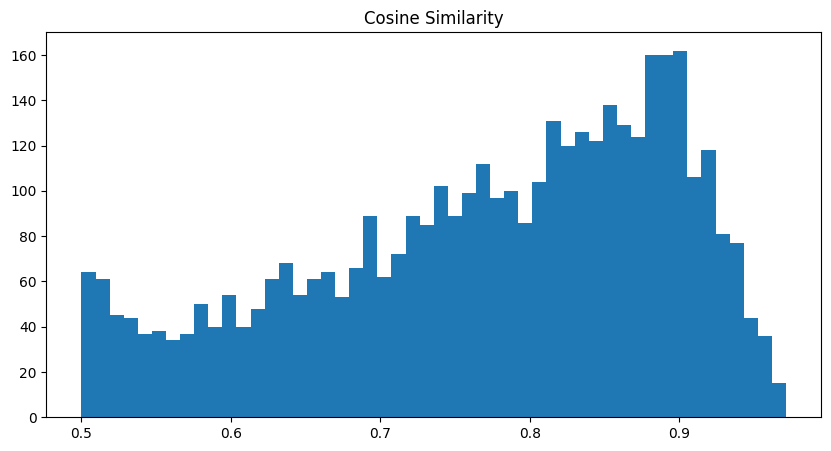

In [135]:
plt.figure(figsize=(10,5))

plt.hist(
    results_df["similarity"],
    bins=50)

plt.title(
    "Cosine Similarity")

plt.show()

## **Visualización de Resultados**

### **Máscaras de Segmentación**  
Se visualiza una muestra aleatoria de las máscaras generadas por SAM2 para evaluar la precisión del proceso de segmentación. Esta revisión permite verificar que las regiones correspondientes a los productos fueron correctamente identificadas y separadas del fondo antes de las etapas de reconocimiento y análisis.

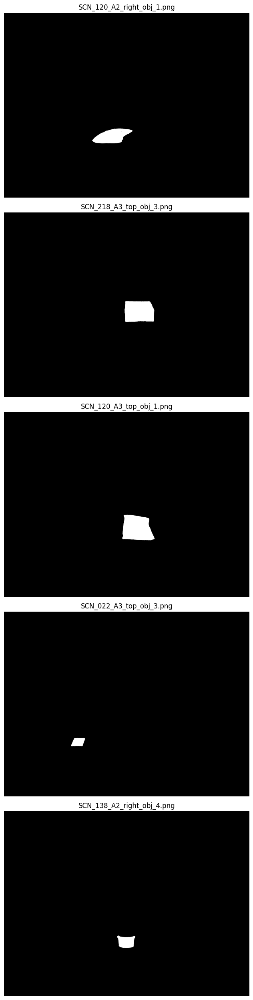

In [136]:
#Máscaras SAM
mask_files = glob(
    os.path.join(
        MASKS_DIR,
        "*.png"))

sample_files = random.sample(
    mask_files,
    min(5, len(mask_files)))

fig, axes = plt.subplots(
    len(sample_files),
    1,
    figsize=(8, 5*len(sample_files)))

if len(sample_files) == 1:
    axes = [axes]

for ax, file in zip(
    axes,
    sample_files
):

    mask = cv2.imread(
        file,
        cv2.IMREAD_GRAYSCALE)

    ax.imshow(
        mask,
        cmap="gray")

    ax.set_title(
        os.path.basename(file))

    ax.axis("off")

plt.tight_layout()
plt.show()

### **Resultados de Detección y Segmentación**  
Se inspeccionan visualmente los overlays generados durante el pipeline, los cuales combinan la imagen original con las máscaras segmentadas y las detecciones obtenidas. Esta revisión permite evaluar de forma cualitativa el desempeño conjunto de Grounding DINO y SAM2, verificando la localización y segmentación de los productos dentro de las escenas.

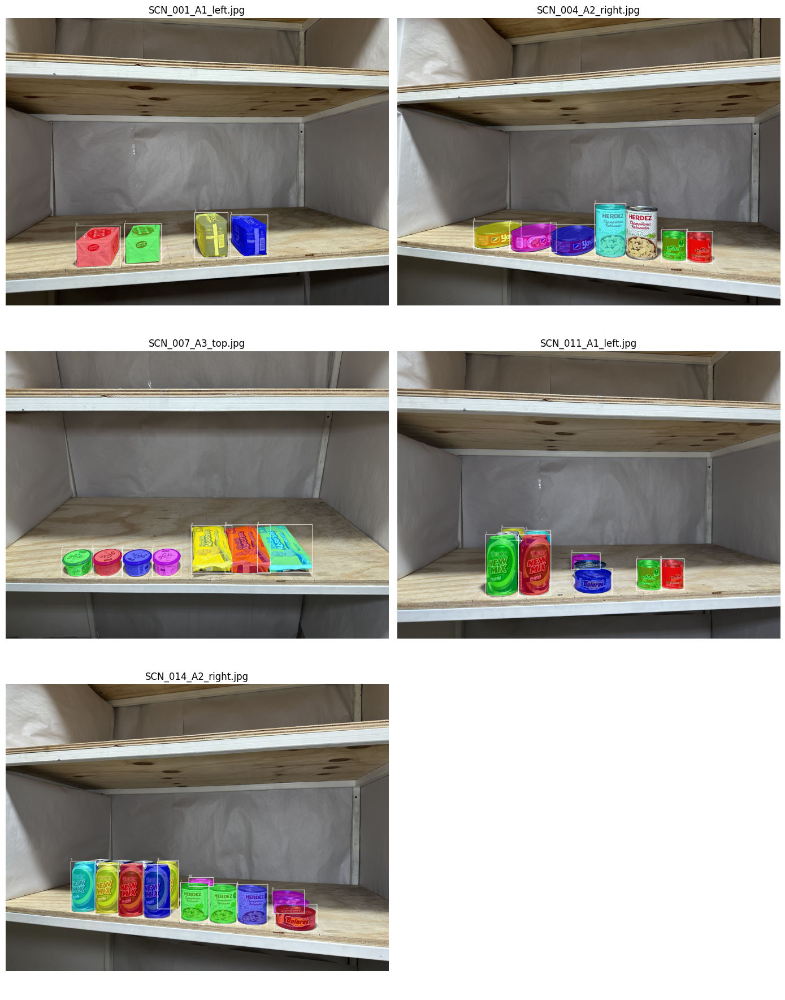

In [137]:
#Overlays
overlay_files = glob(
    os.path.join(
        OVERLAY_DIR,
        "*.jpg"
    )
)

sample_files = random.sample(
    overlay_files,
    min(5, len(overlay_files))
)

rows = 3
cols = 2

fig, axes = plt.subplots(
    rows,
    cols,
    figsize=(14,18)
)

axes = axes.flatten()

for i, file in enumerate(sample_files):

    img = cv2.imread(file)

    img = cv2.cvtColor(
        img,
        cv2.COLOR_BGR2RGB
    )

    axes[i].imshow(img)

    axes[i].set_title(
        os.path.basename(file)
    )

    axes[i].axis("off")

for j in range(
    len(sample_files),
    len(axes)
):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

## **Resumen de Resultados**  
Se obtiene un resumen de los resultados generados por el pipeline, incluyendo el número total de objetos identificados y la distribución de predicciones por SKU.

In [138]:
#Total de objetos predichos
print(len(results_df))

#Total de predicciones por SKU
print(
    results_df["predicted_sku"]
    .value_counts()
    .head(20)
)

4054
predicted_sku
SKU008    619
SKU005    501
SKU022    407
SKU007    395
SKU001    373
SKU033    193
SKU019    151
SKU029    119
SKU017    118
SKU032    111
SKU020    110
SKU013    107
SKU023     88
SKU024     87
SKU009     70
SKU003     66
SKU027     63
SKU021     55
SKU004     54
SKU002     53
Name: count, dtype: int64


In [139]:
pred_df = pd.read_csv(
    "scene_predictions.csv")

pred_df["scene_id"] = (
    pred_df["scene"]
    .str.extract(r"(SCN_\d+)")
)

### **Selección de la Vista Más Representativa por Escena**  
Se contabilizan las detecciones obtenidas en cada vista de una misma escena y se selecciona aquella con el mayor número de objetos identificados. Esta estrategia permite utilizar una única representación por escena durante la evaluación, reduciendo la redundancia generada por las múltiples perspectivas disponibles.

In [140]:
#Detecciones por imagen
view_counts = (
    pred_df
    .groupby("scene")
    .size()
    .reset_index(name="num_detections")
)

#Asignar scene ID
view_counts["scene_id"] = (
    view_counts["scene"]
    .str.extract(r"(SCN_\d+)")
)

#Escoger vista ganadora
best_views = (
    view_counts
    .sort_values(
        "num_detections",
        ascending=False
    )
    .groupby("scene_id")
    .first()
    .reset_index()
)

#Ejemplo
print(
    best_views.head(20)
)

   scene_id                 scene  num_detections
0   SCN_001  SCN_001_A2_right.jpg               4
1   SCN_002    SCN_002_A3_top.jpg               1
2   SCN_003  SCN_003_A2_right.jpg               4
3   SCN_004    SCN_004_A3_top.jpg               7
4   SCN_005    SCN_005_A3_top.jpg               6
5   SCN_006   SCN_006_A1_left.jpg               4
6   SCN_007  SCN_007_A2_right.jpg               7
7   SCN_008  SCN_008_A2_right.jpg               5
8   SCN_009  SCN_009_A2_right.jpg               6
9   SCN_010    SCN_010_A3_top.jpg               5
10  SCN_011    SCN_011_A3_top.jpg              10
11  SCN_012    SCN_012_A3_top.jpg               6
12  SCN_013    SCN_013_A3_top.jpg              10
13  SCN_014    SCN_014_A3_top.jpg              14
14  SCN_015  SCN_015_A2_right.jpg               8
15  SCN_016    SCN_016_A3_top.jpg               8
16  SCN_017    SCN_017_A3_top.jpg              13
17  SCN_018    SCN_018_A3_top.jpg              11
18  SCN_019    SCN_019_A3_top.jpg              11


Se conservan únicamente las predicciones correspondientes a la vista seleccionada para cada escena y posteriormente se agrupan los SKU identificados

In [141]:
#Filtrar predicciones
pred_best = pred_df.merge(
    best_views[
        ["scene_id","scene"]
    ],
    on=["scene_id","scene"]
)

#Agrupar
pred_per_scene = (
    pred_best
    .groupby("scene_id")
    ["predicted_sku"]
    .apply(list)
    .reset_index()
)

### **Integración de Predicciones y Anotaciones de Referencia**  
Se combinan las anotaciones reales de las escenas con las predicciones generadas por el pipeline utilizando el identificador de escena como clave de unión.

In [142]:
scenes_number = MAX_IMAGES // 3

gt_df = pd.read_csv(
    SCENE_ANNOTATIONS)[0:scenes_number]

eval_df = gt_df.merge(
    pred_per_scene,
    on="scene_id",
    how="left"
)

print(
    eval_df[
        ["scene_id",
         "sku_counts",
         "predicted_sku"]
    ].head(10).to_string()
)

  scene_id                                                                sku_counts                                             predicted_sku
0  SCN_001                                SKU033 Soap 400g×2; SKU013 Feminine pads×2                          [SKU033, SKU033, SKU013, SKU013]
1  SCN_002               SKU025 Matchbox×3; SKU026 Juice 250ml×2; SKU016 Milk 1 lt×1                                                  [SKU016]
2  SCN_003                               SKU015 Baby towel×2; SKU013 Feminine pads×2                          [SKU013, SKU013, SKU015, SKU015]
3  SCN_004  SKU003 Sardines 425g×3; SKU002 Mushrooms 380g×2; SKU008 Jalapeños 105g×2  [SKU009, SKU008, SKU001, SKU002, SKU007, SKU007, SKU007]
4  SCN_005                                                        SKU007 Tuna 133g×6          [SKU007, SKU007, SKU007, SKU007, SKU007, SKU007]
5  SCN_006                                                  SKU029 Mayonnaise 228g×4                          [SKU029, SKU029, SKU029, SKU029]

### **Evaluación del Desempeño a Nivel de Escena**  
Se calculan métricas de desempeño comparando los SKU detectados por el pipeline contra los SKU reales presentes en cada escena. Además de las métricas clásicas de precisión, recall y F1, se evalúa la capacidad de conteo mediante el error y la exactitud de conteo por escena.

#### Nuevo

In [143]:
from collections import Counter
import re
import pandas as pd

def parse_gt_sku_counts(text):
    """
    Extrae conteos tipo:
    'SKU033 Soap 400g×2; SKU013 Feminine pads×2'
    """
    counts = Counter()

    parts = str(text).split(";")

    for part in parts:
        sku_match = re.search(r"SKU\d+", part)
        count_match = re.search(r"[×xX]\s*(\d+)", part)

        if sku_match:
            sku = sku_match.group(0)
            count = int(count_match.group(1)) if count_match else 1
            counts[sku] += count

    return counts


scene_metrics = []

for _, row in eval_df.iterrows():

    gt_counter = parse_gt_sku_counts(row["sku_counts"])

    pred_counter = Counter(
        row["predicted_sku"]
        if isinstance(row["predicted_sku"], list)
        else []
    )

    gt_total = sum(gt_counter.values())
    pred_total = sum(pred_counter.values())

    correct_count = sum(
        min(gt_counter[sku], pred_counter[sku])
        for sku in gt_counter
    )

    false_positive_count = sum(
        max(0, pred_counter[sku] - gt_counter.get(sku, 0))
        for sku in pred_counter
    )

    false_negative_count = sum(
        max(0, gt_counter[sku] - pred_counter.get(sku, 0))
        for sku in gt_counter
    )

    sku_count_accuracy = (
        correct_count / gt_total
        if gt_total > 0
        else 0
    )

    sku_count_precision = (
        correct_count / pred_total
        if pred_total > 0
        else 0
    )

    sku_count_f1 = (
        2 * sku_count_accuracy * sku_count_precision
        / (sku_count_accuracy + sku_count_precision)
        if sku_count_accuracy + sku_count_precision > 0
        else 0
    )

    scene_metrics.append({
        "scene_id": row["scene_id"],
        "gt_sku_counts": dict(gt_counter),
        "pred_sku_counts": dict(pred_counter),
        "gt_total_products": gt_total,
        "pred_total_products": pred_total,
        "correct_sku_count": correct_count,
        "false_positive_count": false_positive_count,
        "false_negative_count": false_negative_count,
        "sku_count_accuracy": sku_count_accuracy,
        "sku_count_precision": sku_count_precision,
        "sku_count_f1": sku_count_f1,
        "count_error": pred_total - gt_total,
        "abs_count_error": abs(pred_total - gt_total)
    })

scene_metrics_df = pd.DataFrame(scene_metrics)

scene_metrics_df.head()

,scene_id,gt_sku_counts,pred_sku_counts,gt_total_products,pred_total_products,correct_sku_count,false_positive_count,false_negative_count,sku_count_accuracy,sku_count_precision,sku_count_f1,count_error,abs_count_error
0,SCN_001,"{'SKU033': 2, 'SKU013': 2}","{'SKU033': 2, 'SKU013': 2}",4,4,4,0,0,1.000000,1.000000,1.000000,0,0
1,SCN_002,"{'SKU025': 3, 'SKU026': 2, 'SKU016': 1}",{'SKU016': 1},6,1,1,0,5,0.166667,1.000000,0.285714,-5,5
2,SCN_003,"{'SKU015': 2, 'SKU013': 2}","{'SKU013': 2, 'SKU015': 2}",4,4,4,0,0,1.000000,1.000000,1.000000,0,0
3,SCN_004,"{'SKU003': 3, 'SKU002': 2, 'SKU008': 2}","{'SKU009': 1, 'SKU008': 1, 'SKU001': 1, 'SKU00...",7,7,2,5,5,0.285714,0.285714,0.285714,0,0
4,SCN_005,{'SKU007': 6},{'SKU007': 6},6,6,6,0,0,1.000000,1.000000,1.000000,0,0


In [144]:
scene_metrics_df.head(20)

,scene_id,gt_sku_counts,pred_sku_counts,gt_total_products,pred_total_products,correct_sku_count,false_positive_count,false_negative_count,sku_count_accuracy,sku_count_precision,sku_count_f1,count_error,abs_count_error
0,SCN_001,"{'SKU033': 2, 'SKU013': 2}","{'SKU033': 2, 'SKU013': 2}",4,4,4,0,0,1.000000,1.000000,1.000000,0,0
1,SCN_002,"{'SKU025': 3, 'SKU026': 2, 'SKU016': 1}",{'SKU016': 1},6,1,1,0,5,0.166667,1.000000,0.285714,-5,5
2,SCN_003,"{'SKU015': 2, 'SKU013': 2}","{'SKU013': 2, 'SKU015': 2}",4,4,4,0,0,1.000000,1.000000,1.000000,0,0
3,SCN_004,"{'SKU003': 3, 'SKU002': 2, 'SKU008': 2}","{'SKU009': 1, 'SKU008': 1, 'SKU001': 1, 'SKU00...",7,7,2,5,5,0.285714,0.285714,0.285714,0,0
4,SCN_005,{'SKU007': 6},{'SKU007': 6},6,6,6,0,0,1.000000,1.000000,1.000000,0,0
5,SCN_006,{'SKU029': 4},{'SKU029': 4},4,4,4,0,0,1.000000,1.000000,1.000000,0,0
6,SCN_007,"{'SKU032': 4, 'SKU015': 3}","{'SKU032': 4, 'SKU013': 1, 'SKU012': 1, 'SKU01...",7,7,5,2,2,0.714286,0.714286,0.714286,0,0
7,SCN_008,"{'SKU030': 5, 'SKU013': 3}","{'SKU013': 2, 'SKU030': 3}",8,5,5,0,3,0.625000,1.000000,0.769231,-3,3
8,SCN_009,"{'SKU024': 3, 'SKU019': 3}","{'SKU024': 3, 'SKU019': 3}",6,6,6,0,0,1.000000,1.000000,1.000000,0,0
9,SCN_010,"{'SKU025': 3, 'SKU020': 2}","{'SKU020': 3, 'SKU025': 1, 'SKU023': 1}",5,5,3,2,2,0.600000,0.600000,0.600000,0,0


In [145]:
print("===== MÉTRICAS POR CONTEO DE SKU =====")

print("SKU Count Accuracy:", scene_metrics_df["sku_count_accuracy"].mean())
print("SKU Count Precision:", scene_metrics_df["sku_count_precision"].mean())
print("SKU Count F1:", scene_metrics_df["sku_count_f1"].mean())
print("MAE Count:", scene_metrics_df["abs_count_error"].mean())

===== MÉTRICAS POR CONTEO DE SKU =====
SKU Count Accuracy: 0.3962720998628269
SKU Count Precision: 0.750468294613276
SKU Count F1: 0.49256251486609864
MAE Count: 6.204460966542751


# **Modelo Baseline: YOLO**

## **Preparación del Dataset para YOLO-Seg**  
Se definen las rutas necesarias para construir el conjunto de datos en formato YOLO-Seg y se crea la estructura de carpetas requerida para entrenamiento y validación. Posteriormente, se cargan las predicciones generadas previamente por el pipeline, las cuales serán utilizadas como pseudo-etiquetas para convertir las máscaras de SAM2 en anotaciones compatibles con YOLO.

### Nuevo

In [41]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 40.3 MB/s eta 0:00:00


In [146]:
import os
import cv2
import yaml
import shutil
import random
import numpy as np
import pandas as pd

from pathlib import Path
from glob import glob
from tqdm import tqdm
from ultralytics import YOLO

# ==========================
# RUTAS
# ==========================

PRED_CSV = "/content/outputs_temp/scene_predictions.csv"

YOLO_DIR = "/content/dataset_yolo_seg_mixed_v2"

ROBOFLOW_YAML = Path(
    "/content/drive/MyDrive/Proyecto_Integrador/Proyecto Integrador/Retail_SKU.yolov8/data.yaml"
)

# ==========================
# LIMPIAR DATASET
# ==========================

if os.path.exists(YOLO_DIR):
    shutil.rmtree(YOLO_DIR)

for split in ["train", "val"]:
    os.makedirs(f"{YOLO_DIR}/images/{split}", exist_ok=True)
    os.makedirs(f"{YOLO_DIR}/labels/{split}", exist_ok=True)

In [147]:
# ==========================
# CLASES OFICIALES SKU
# ==========================

catalog = pd.read_csv(PRODUCT_CATALOG, encoding="latin1")

sku_classes = sorted(catalog["sku_id"].unique())

sku_to_id = {
    sku: i
    for i, sku in enumerate(sku_classes)
}

# ==========================
# MANUAL MAP ROBOFLOW → SKU
# ==========================

manual_map = {
    "aluminium_foil": "SKU017",
    "amica_ointment": "SKU031",
    "annatto": "SKU024",
    "baby_food": "SKU027",
    "baby_towel": "SKU015",
    "backing_soda": "SKU020",
    "beverage_can": "SKU005",
    "coconut_cream": "SKU004",
    "flour": "SKU014",
    "fragance_air_fresher": "SKU032",
    "fruits_syrup": "SKU009",
    "hair_gel": "SKU030",
    "jalapenos": "SKU008",
    "juice": "SKU026",
    "mayonnaise": "SKU029",
    "milk": "SKU016",
    "olives": "SKU028",
    "rice": "SKU011",
    "salt": "SKU012",
    "sardines": "SKU003",
    "soap": "SKU033",
    "table_cream": "SKU006",
    "tomato_sauce": "SKU018",
    "tuna": "SKU007",
    "vegetable_shortening": "SKU010",
    "yeast": "SKU021",
    "drinking_chocolate": "SKU019",
    "femenine_pads": "SKU013",
    "feminine_pads": "SKU013",
    "instant_soup": "SKU022",
    "matchbox": "SKU025",
    "mushrooms_180g": "SKU001",
    "mushrooms_380g": "SKU002",
    "tea": "SKU023",

}

# ==========================
# CARGAR ROBOFLOW YAML
# ==========================

with open(ROBOFLOW_YAML, "r") as f:
    rf_yaml = yaml.safe_load(f)

rf_names = rf_yaml["names"]

if isinstance(rf_names, dict):
    rf_id_to_name = {int(k): v for k, v in rf_names.items()}
else:
    rf_id_to_name = {i: name for i, name in enumerate(rf_names)}

rf_id_to_sku_id = {}

for rf_id, rf_name in rf_id_to_name.items():

    if rf_name not in manual_map:
        print("Falta mapear:", rf_name)
        continue

    sku = manual_map[rf_name]

    if sku not in sku_to_id:
        print("SKU no existe:", sku)
        continue

    rf_id_to_sku_id[rf_id] = sku_to_id[sku]

print("Mapeo RF → SKU listo")
print(rf_id_to_sku_id)

# ==========================
# CONVERTIR LABEL ROBOFLOW
# ==========================

def convert_roboflow_label(src_label, dst_label):

    new_lines = []

    if not src_label.exists():
        dst_label.write_text("")
        return

    for line in src_label.read_text().splitlines():

        parts = line.strip().split()

        if len(parts) < 5:
            continue

        old_id = int(parts[0])

        if old_id not in rf_id_to_sku_id:
            continue

        parts[0] = str(rf_id_to_sku_id[old_id])

        new_lines.append(" ".join(parts))

    dst_label.write_text("\n".join(new_lines))

# ==========================
# AGREGAR ROBOFLOW
# ==========================

ROBOFLOW_BASE = ROBOFLOW_YAML.parent

for split_rf, split_out in [
    ("train", "train"),
    ("valid", "val"),
    ("test", "val")
]:

    img_dir = ROBOFLOW_BASE / split_rf / "images"
    lbl_dir = ROBOFLOW_BASE / split_rf / "labels"

    if not img_dir.exists():
        print("No existe:", img_dir)
        continue

    for img_path in tqdm(
        list(img_dir.glob("*")),
        desc=f"Copiando Roboflow {split_rf}"
    ):

        if img_path.suffix.lower() not in [".jpg", ".jpeg", ".png"]:
            continue

        new_name = "rf_" + img_path.name

        dst_img = Path(YOLO_DIR) / "images" / split_out / new_name
        dst_lbl = Path(YOLO_DIR) / "labels" / split_out / f"{Path(new_name).stem}.txt"

        shutil.copy2(img_path, dst_img)

        src_lbl = lbl_dir / f"{img_path.stem}.txt"

        convert_roboflow_label(
            src_lbl,
            dst_lbl
        )

print("Roboflow agregado")

Mapeo RF → SKU listo
{0: 16, 1: 30, 2: 23, 3: 26, 4: 14, 5: 19, 6: 4, 7: 3, 8: 18, 9: 12, 10: 13, 11: 31, 12: 8, 13: 29, 14: 21, 15: 7, 16: 25, 17: 24, 18: 28, 19: 15, 20: 0, 21: 1, 22: 27, 23: 10, 24: 11, 25: 2, 26: 32, 27: 5, 28: 22, 29: 17, 30: 6, 31: 9, 32: 20}


Copiando Roboflow test: 100%|██████████| 14/14 [00:00<00:00, 83.62it/s]

Roboflow agregado


In [148]:
# ==========================
# MÁSCARA → POLÍGONO YOLO
# ==========================

def mask_to_yolo_polygon(mask, img_w, img_h, min_area=50):

    if mask is None:
        return None

    mask = (mask > 0).astype(np.uint8)

    contours, _ = cv2.findContours(
        mask,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    if len(contours) == 0:
        return None

    contour = max(contours, key=cv2.contourArea)

    if cv2.contourArea(contour) < min_area:
        return None

    epsilon = 0.0015 * cv2.arcLength(contour, True)

    contour = cv2.approxPolyDP(
        contour,
        epsilon,
        True
    )

    if len(contour) < 3:
        return None

    polygon = []

    for point in contour:
        x, y = point[0]
        polygon.append(x / img_w)
        polygon.append(y / img_h)

    return polygon

# ==========================
# AGREGAR PSEUDO-LABELS SAM + DINO
# ==========================

pred_df = pd.read_csv(PRED_CSV)

# Menos agresivo, parecido a tu versión inicial
MIN_SIMILARITY = 0.50
MIN_MARGIN = 0.00

if "similarity_margin" in pred_df.columns:
    pred_df = pred_df[
        (pred_df["similarity"] >= MIN_SIMILARITY)
        &
        (pred_df["similarity_margin"] >= MIN_MARGIN)
    ].copy()
else:
    pred_df = pred_df[
        pred_df["similarity"] >= MIN_SIMILARITY
    ].copy()

print("Pseudo-labels usados:", len(pred_df))

def get_split(scene_name, val_ratio=0.2):

    scene_id = scene_name.split("_A")[0]

    random.seed(scene_id)

    return "val" if random.random() < val_ratio else "train"

scene_groups = pred_df.groupby("scene")

created_pseudo_images = 0
skipped_masks = 0
skipped_images = 0

for scene_name, group in tqdm(scene_groups, desc="Agregando pseudo-labels"):

    image_path = os.path.join(
        SCENES_DIR,
        scene_name
    )

    if not os.path.exists(image_path):
        skipped_images += 1
        continue

    image = cv2.imread(image_path)

    if image is None:
        skipped_images += 1
        continue

    h, w = image.shape[:2]

    split = get_split(scene_name)

    dst_img = os.path.join(
        YOLO_DIR,
        "images",
        split,
        "pseudo_" + scene_name
    )

    label_path = os.path.join(
        YOLO_DIR,
        "labels",
        split,
        "pseudo_" + Path(scene_name).stem + ".txt"
    )

    lines = []

    for _, row in group.iterrows():

        sku = row["predicted_sku"]

        if sku not in sku_to_id:
            continue

        class_id = sku_to_id[sku]

        mask_path = row.get("mask_path", None)

        if pd.isna(mask_path) or not os.path.exists(mask_path):
            skipped_masks += 1
            continue

        mask = cv2.imread(
            mask_path,
            cv2.IMREAD_GRAYSCALE
        )

        polygon = mask_to_yolo_polygon(
            mask,
            w,
            h
        )

        if polygon is None:
            skipped_masks += 1
            continue

        line = (
            str(class_id)
            + " "
            + " ".join(map(str, polygon))
        )

        lines.append(line)

    if len(lines) == 0:
        continue

    shutil.copy2(
        image_path,
        dst_img
    )

    with open(label_path, "w") as f:
        f.write("\n".join(lines))

    created_pseudo_images += 1

print("Pseudo imágenes agregadas:", created_pseudo_images)
print("Máscaras omitidas:", skipped_masks)
print("Imágenes omitidas:", skipped_images)

# ==========================
# DATASET YAML
# ==========================

yaml_data = {
    "path": os.path.abspath(YOLO_DIR),
    "train": "images/train",
    "val": "images/val",
    "nc": len(sku_classes),
    "names": sku_classes
}

yaml_path = Path(YOLO_DIR) / "dataset.yaml"

with open(yaml_path, "w") as f:
    yaml.dump(
        yaml_data,
        f,
        sort_keys=False
    )

print("YAML guardado en:", yaml_path)

print("Train images:", len(glob(f"{YOLO_DIR}/images/train/*")))
print("Val images:", len(glob(f"{YOLO_DIR}/images/val/*")))
print("Train labels:", len(glob(f"{YOLO_DIR}/labels/train/*")))
print("Val labels:", len(glob(f"{YOLO_DIR}/labels/val/*")))

Pseudo-labels usados: 4054


Agregando pseudo-labels: 100%|██████████| 754/754 [05:26<00:00,  2.31it/s]

Pseudo imágenes agregadas: 754
Máscaras omitidas: 0
Imágenes omitidas: 0
YAML guardado en: /content/dataset_yolo_seg_mixed_v2/dataset.yaml
Train images: 713
Val images: 176
Train labels: 713
Val labels: 176


## **Entrenamiento del Modelo YOLO-Seg**  
Se entrena un modelo YOLO-Seg utilizando el conjunto de datos generado a partir de las pseudo-etiquetas obtenidas con Grounding DINO, SAM2 y DINOv2. Durante el entrenamiento, el modelo aprende a detectar y segmentar productos directamente sobre las imágenes de las escenas, utilizando las máscaras generadas automáticamente como referencia. Esta etapa permite construir un modelo supervisado capaz de realizar inferencia de manera más rápida y eficiente sobre nuevas escenas.

In [149]:
model = YOLO("yolo11n-seg.pt")  # usa n si quieres más rápido

model.train(
    data=str(yaml_path),
    epochs=100,
    imgsz=1280,
    batch=8,
    patience=25,
    workers=4,
    device=0,
    project="/content/runs_yolo",
    name="sku_seg_mixed_v2",
    exist_ok=True
)

Ultralytics 8.4.67 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset_yolo_seg_mixed_v2/dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1280, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=sku_seg_mixed_v2, nbs=64, nms=False, opset=None, optimize=False, optim

ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b52321270b0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,  

## **Evaluación del modelo**  
Se evalúa el desempeño del modelo entrenado utilizando el conjunto de validación. Las métricas reportadas corresponden al mean Average Precision para segmentación, tanto con un umbral IoU de 0.50 (mAP50) como promediado sobre múltiples umbrales IoU (mAP50-95). Estos indicadores permiten cuantificar la capacidad del modelo para localizar y segmentar correctamente los productos presentes en las escenas.

In [150]:
metrics = model.val()

print(metrics.seg.map50)
print(metrics.seg.map)

Ultralytics 8.4.67 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)
YOLO11n-seg summary (fused): 114 layers, 2,841,003 parameters, 0 gradients, 9.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2964.3±1821.9 MB/s, size: 2751.7 KB)
val: Scanning /content/dataset_yolo_seg_mixed_v2/labels/val.cache... 176 images, 13 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 176/176 67.1Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 11/11 1.3it/s 8.6s
                   all        176        915      0.549        0.7      0.651      0.611      0.549        0.7       0.65      0.605
                SKU001         24         68      0.645      0.882      0.883      0.857      0.645      0.882      0.883      0.821
                SKU002          8         17      0.552      0.647      0.646      0.639      0.552      0.647      0.646       0.64
           

### **Inferencia sobre Escenas**  
Se ejecuta el modelo YOLO-Seg entrenado sobre las imágenes de las escenas para generar predicciones de detección y segmentación.

In [151]:
CHECKPOINT_CSV = (
    "/content/drive/MyDrive/Pruebas_Proyecto_Integrador/"
    "Avance6_Equipo18/yolo_seg_checkpoint.csv"
)

yolo_seg_rows = []

for idx, r in enumerate(
    model.predict(
        source=scene_paths,
        conf=0.25,
        imgsz=512,
        batch=1,
        stream=True,
        save=False,
        verbose=False,
        device=0
    )
):

    original_path = scene_paths[idx]

    file_name = Path(original_path).name
    scene_id = Path(original_path).stem

    if r.boxes is not None and len(r.boxes) > 0:

        boxes = r.boxes.xyxy.cpu().numpy()
        confs = r.boxes.conf.cpu().numpy()
        clss = r.boxes.cls.cpu().numpy().astype(int)

        for box, conf, cls_id in zip(boxes, confs, clss):

            yolo_seg_rows.append({
                "scene_id": scene_id,
                "file_name": file_name,
                "yolo_file_name": Path(r.path).name,
                "yolo_path": r.path,
                "original_path": original_path,
                "sku_id": model.names[int(cls_id)],
                "score": float(conf),
                "x1": float(box[0]),
                "y1": float(box[1]),
                "x2": float(box[2]),
                "y2": float(box[3]),
            })

    # Checkpoint cada 10 imágenes
    if idx % 10 == 0 and len(yolo_seg_rows) > 0:

        pd.DataFrame(
            yolo_seg_rows
        ).to_csv(
            CHECKPOINT_CSV,
            index=False
        )

        print(
            f"Checkpoint guardado: {idx}"
        )

    del r

    gc.collect()

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

# Guardado final
yolo_seg_dets = pd.DataFrame(yolo_seg_rows)

FINAL_CSV = (
    "/content/drive/MyDrive/Pruebas_Proyecto_Integrador/"
    "Avance6_Equipo18/yolo_seg_dets_final.csv"
)

yolo_seg_dets.to_csv(
    FINAL_CSV,
    index=False
)

print("Guardado final:")
print(FINAL_CSV)

print("Detecciones:", len(yolo_seg_dets))

Checkpoint guardado: 0
Checkpoint guardado: 10
Checkpoint guardado: 20
Checkpoint guardado: 30
Checkpoint guardado: 40
Checkpoint guardado: 50
Checkpoint guardado: 60
Checkpoint guardado: 70
Checkpoint guardado: 80
Checkpoint guardado: 90
Checkpoint guardado: 100
Checkpoint guardado: 110
Checkpoint guardado: 120
Checkpoint guardado: 130
Checkpoint guardado: 140
Checkpoint guardado: 150
Checkpoint guardado: 160
Checkpoint guardado: 170
Checkpoint guardado: 180
Checkpoint guardado: 190
Checkpoint guardado: 200
Checkpoint guardado: 210
Checkpoint guardado: 220
Checkpoint guardado: 230
Checkpoint guardado: 240
Checkpoint guardado: 250
Checkpoint guardado: 260
Checkpoint guardado: 270
Checkpoint guardado: 280
Checkpoint guardado: 290
Checkpoint guardado: 300
Checkpoint guardado: 310
Checkpoint guardado: 320
Checkpoint guardado: 330
Checkpoint guardado: 340
Checkpoint guardado: 350
Checkpoint guardado: 360
Checkpoint guardado: 370
Checkpoint guardado: 380
Checkpoint guardado: 390
Checkpoint 

### **Visualización de Predicciones**  
Se visualizan las predicciones realizadas por el modelo YOLO-Seg sobre las escenas procesadas. Las imágenes anotadas muestran las detecciones, clasificaciones y segmentaciones generadas por el modelo, permitiendo realizar una evaluación cualitativa de su desempeño y comparar visualmente los resultados obtenidos respecto a las pseudo-etiquetas utilizadas durante el entrenamiento.

In [102]:
#Por ahora no lo corremos para no sobre saturar la RAM
n_images = len(results)

cols = 2
rows = math.ceil(
    n_images / cols)

fig, axes = plt.subplots(
    rows,
    cols,
    figsize=(12, 6*rows))

axes = axes.flatten()

for i, result in enumerate(results):

    annotated = result.plot()

    axes[i].imshow(
        annotated[..., ::-1])

    axes[i].set_title(
        os.path.basename(
            result.path),
        fontsize=10)

    axes[i].axis("off")

# Ocultar espacios vacíos
for j in range(
    n_images,
    len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

NameError: name 'results' is not defined

In [152]:
#Para visualziar solo las 5 con mayores detecciones,
#menores y con mayor score promedio

# Conteo por imagen
counts_df = (
    yolo_seg_dets
    .groupby("file_name")
    .size()
    .reset_index(name="num_detections")
)

# Score promedio por imagen
score_df = (
    yolo_seg_dets
    .groupby("file_name")["score"]
    .mean()
    .reset_index(name="avg_score")
)

top5_most = counts_df.nlargest(5, "num_detections")
top5_least = counts_df.nsmallest(5, "num_detections")
top5_bestscore = score_df.nlargest(5, "avg_score")

display(top5_most)
display(top5_least)
display(top5_bestscore)

,file_name,num_detections
35,SCN_012_A3_top.jpg,19
41,SCN_014_A3_top.jpg,19
212,SCN_079_A3_top.jpg,19
256,SCN_095_A3_top.jpg,19
50,SCN_017_A3_top.jpg,18


,file_name,num_detections
98,SCN_035_A3_top.jpg,1
138,SCN_051_A2_right.jpg,1
139,SCN_051_A3_top.jpg,1
162,SCN_061_A1_left.jpg,1
163,SCN_061_A2_right.jpg,1


,file_name,avg_score
471,SCN_172_A2_right.jpg,0.997598
554,SCN_200_A2_right.jpg,0.995274
487,SCN_178_A1_left.jpg,0.994355
488,SCN_178_A2_right.jpg,0.993410
114,SCN_041_A1_left.jpg,0.985659


In [153]:
#Sacar grupos
counts_df = (
    yolo_seg_dets
    .groupby(["file_name", "original_path"])
    .size()
    .reset_index(name="num_detections")
)

score_df = (
    yolo_seg_dets
    .groupby(["file_name", "original_path"])["score"]
    .mean()
    .reset_index(name="avg_score")
)

top5_most = counts_df.nlargest(5, "num_detections")
top5_least = counts_df.nsmallest(5, "num_detections")
top5_bestscore = score_df.nlargest(5, "avg_score")

display(top5_most)
display(top5_least)
display(top5_bestscore)

,file_name,original_path,num_detections
35,SCN_012_A3_top.jpg,/content/drive/MyDrive/Proyecto_Integrador/Pro...,19
41,SCN_014_A3_top.jpg,/content/drive/MyDrive/Proyecto_Integrador/Pro...,19
212,SCN_079_A3_top.jpg,/content/drive/MyDrive/Proyecto_Integrador/Pro...,19
256,SCN_095_A3_top.jpg,/content/drive/MyDrive/Proyecto_Integrador/Pro...,19
50,SCN_017_A3_top.jpg,/content/drive/MyDrive/Proyecto_Integrador/Pro...,18


,file_name,original_path,num_detections
98,SCN_035_A3_top.jpg,/content/drive/MyDrive/Proyecto_Integrador/Pro...,1
138,SCN_051_A2_right.jpg,/content/drive/MyDrive/Proyecto_Integrador/Pro...,1
139,SCN_051_A3_top.jpg,/content/drive/MyDrive/Proyecto_Integrador/Pro...,1
162,SCN_061_A1_left.jpg,/content/drive/MyDrive/Proyecto_Integrador/Pro...,1
163,SCN_061_A2_right.jpg,/content/drive/MyDrive/Proyecto_Integrador/Pro...,1


,file_name,original_path,avg_score
471,SCN_172_A2_right.jpg,/content/drive/MyDrive/Proyecto_Integrador/Pro...,0.997598
554,SCN_200_A2_right.jpg,/content/drive/MyDrive/Proyecto_Integrador/Pro...,0.995274
487,SCN_178_A1_left.jpg,/content/drive/MyDrive/Proyecto_Integrador/Pro...,0.994355
488,SCN_178_A2_right.jpg,/content/drive/MyDrive/Proyecto_Integrador/Pro...,0.993410
114,SCN_041_A1_left.jpg,/content/drive/MyDrive/Proyecto_Integrador/Pro...,0.985659


In [154]:
#Función para ver todo dibujado
def show_yolo_group(df_group, title):

    fig, axes = plt.subplots(
        1,
        len(df_group),
        figsize=(35, 8)
    )

    fig.suptitle(
        title,
        fontsize=22,
        fontweight="bold"
    )

    if len(df_group) == 1:
        axes = [axes]

    for ax, (_, row) in zip(axes, df_group.iterrows()):

        img_path = row["original_path"]
        file_name = row["file_name"]

        img = cv2.imread(img_path)

        if img is None:
            ax.set_title(
                f"No abre:\n{file_name}",
                fontsize=10
            )
            ax.axis("off")
            continue

        img = cv2.cvtColor(
            img,
            cv2.COLOR_BGR2RGB
        )

        dets = yolo_seg_dets[
            yolo_seg_dets["file_name"] == file_name
        ]

        for _, det in dets.iterrows():

            x1 = int(det["x1"])
            y1 = int(det["y1"])
            x2 = int(det["x2"])
            y2 = int(det["y2"])

            label = str(det["sku_id"])

            # ======================
            # BOX MÁS GRUESA
            # ======================

            cv2.rectangle(
                img,
                (x1, y1),
                (x2, y2),
                (255, 255, 255),
                8
            )

            # ======================
            # TEXTO MÁS GRANDE
            # ======================

            font_scale = 1.8
            thickness = 5

            (text_w, text_h), _ = cv2.getTextSize(
                label,
                cv2.FONT_HERSHEY_SIMPLEX,
                font_scale,
                thickness
            )

            text_y = max(
                y1 - 10,
                text_h + 15
            )

            # Fondo blanco
            cv2.rectangle(
                img,
                (x1, text_y - text_h - 15),
                (x1 + text_w + 15, text_y + 10),
                (255, 255, 255),
                -1
            )

            # Texto negro
            cv2.putText(
                img,
                label,
                (x1 + 5, text_y),
                cv2.FONT_HERSHEY_SIMPLEX,
                font_scale,
                (0, 0, 0),
                thickness
            )

        ax.imshow(img)

        ax.set_title(
            file_name,
            fontsize=12
        )

        ax.axis("off")

    plt.tight_layout()
    plt.show()

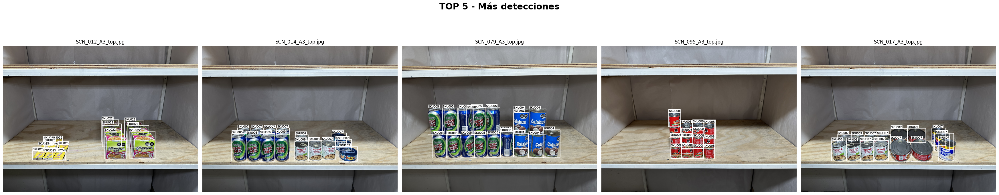

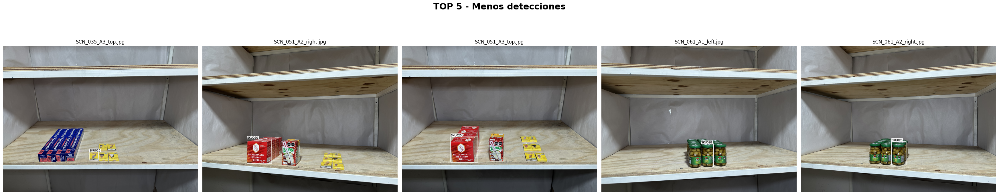

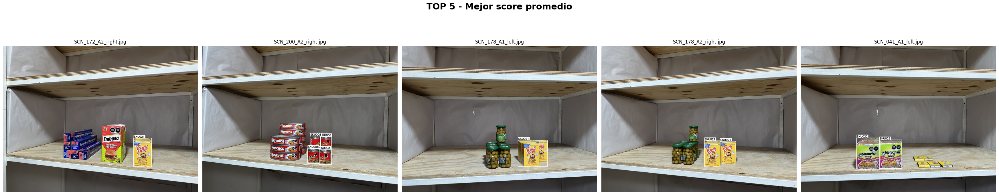

In [155]:
#Visualizamos
show_yolo_group(top5_most, "TOP 5 - Más detecciones")
show_yolo_group(top5_least, "TOP 5 - Menos detecciones")
show_yolo_group(top5_bestscore, "TOP 5 - Mejor score promedio")

# **Parte 2: Conteo Amodal**

In [156]:
# ============================================================
# AMODAL COUNTING - FEATURES MULTIVISTA + GRAFO
# ============================================================

import os
import re
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from collections import Counter
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.dummy import DummyRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import ParameterGrid

RANDOM_SEED = 42

PRED_CSV = "/content/outputs_temp/scene_predictions.csv"

pred_df = pd.read_csv(PRED_CSV)
scene_annotations = pd.read_csv(SCENE_ANNOTATIONS)

# ============================================================
# PREPARAR PREDICCIONES
# ============================================================

pred_df["scene_id"] = (
    pred_df["scene"]
    .astype(str)
    .str.extract(r"(SCN_\d+)")
)

pred_df["view"] = (
    pred_df["scene"]
    .astype(str)
    .str.extract(r"(A\d+_[a-zA-Z]+|front|left|right|top|GT_TOP|GT_SIDE)")
)

pred_df["view"] = pred_df["view"].fillna("unknown")

# Si existen filtros nuevos, puedes aplicarlos aquí
USE_FILTERED_PREDS = False

if USE_FILTERED_PREDS and "similarity_margin" in pred_df.columns:
    pred_df = pred_df[
        (pred_df["similarity"] >= 0.50)
        &
        (pred_df["similarity_margin"] >= 0.00)
    ].copy()

print("Predicciones visibles:", len(pred_df))
print("Escenas con predicción:", pred_df["scene_id"].nunique())

Predicciones visibles: 4054
Escenas con predicción: 262


In [157]:
# ============================================================
# FUNCIONES AUXILIARES
# ============================================================

def parse_gt_sku_counts(text):
    counts = Counter()
    parts = str(text).split(";")

    for part in parts:
        sku_match = re.search(r"SKU\d+", part)
        count_match = re.search(r"[×xX]\s*(\d+)", part)

        if sku_match:
            sku = sku_match.group(0)
            count = int(count_match.group(1)) if count_match else 1
            counts[sku] += count

    return counts


def compute_iou_matrix(boxes):
    n = len(boxes)

    if n == 0:
        return np.zeros((0, 0))

    iou = np.zeros((n, n), dtype=float)

    for i in range(n):
        x1, y1, x2, y2 = boxes[i]
        area_i = max(0, x2-x1) * max(0, y2-y1)

        for j in range(i+1, n):
            xx1, yy1, xx2, yy2 = boxes[j]
            area_j = max(0, xx2-xx1) * max(0, yy2-yy1)

            ix1 = max(x1, xx1)
            iy1 = max(y1, yy1)
            ix2 = min(x2, xx2)
            iy2 = min(y2, yy2)

            inter = max(0, ix2-ix1) * max(0, iy2-iy1)
            union = area_i + area_j - inter

            val = inter / union if union > 0 else 0

            iou[i, j] = val
            iou[j, i] = val

    return iou


def graph_features_for_view(dets):
    if len(dets) == 0:
        return np.zeros(18)

    boxes = dets[
        ["bbox_x1", "bbox_y1", "bbox_x2", "bbox_y2"]
    ].values.astype(float)

    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]

    widths = x2 - x1
    heights = y2 - y1
    areas = widths * heights

    cx = (x1 + x2) / 2
    cy = (y1 + y2) / 2

    n = len(dets)

    # Distancias entre centros
    if n > 1:
        centers = np.vstack([cx, cy]).T
        dist_mat = np.sqrt(
            ((centers[:, None, :] - centers[None, :, :]) ** 2).sum(axis=2)
        )

        nonzero_dist = dist_mat[dist_mat > 0]

        mean_dist = nonzero_dist.mean()
        min_dist = nonzero_dist.min()
        std_dist = nonzero_dist.std()

        iou_mat = compute_iou_matrix(boxes)
        upper_iou = iou_mat[np.triu_indices(n, k=1)]

        mean_iou = upper_iou.mean()
        max_iou = upper_iou.max()
        overlap_edges = (upper_iou > 0.05).sum()

    else:
        mean_dist = 0
        min_dist = 0
        std_dist = 0
        mean_iou = 0
        max_iou = 0
        overlap_edges = 0

    # Features de layout
    y_order_spread = cy.std()
    x_order_spread = cx.std()

    # Aproximación de capas verticales/horizontales
    y_bins = pd.cut(cy, bins=3, labels=False, duplicates="drop")
    x_bins = pd.cut(cx, bins=3, labels=False, duplicates="drop")

    y_layer_count = len(pd.Series(y_bins).dropna().unique())
    x_layer_count = len(pd.Series(x_bins).dropna().unique())

    # Similaridades
    sim_mean = dets["similarity"].mean() if "similarity" in dets else 0
    sim_std = dets["similarity"].std() if len(dets) > 1 and "similarity" in dets else 0
    sim_min = dets["similarity"].min() if "similarity" in dets else 0

    feats = np.array([
        n,
        widths.mean(),
        widths.std() if n > 1 else 0,
        heights.mean(),
        heights.std() if n > 1 else 0,
        areas.mean(),
        areas.std() if n > 1 else 0,
        mean_dist,
        min_dist,
        std_dist,
        mean_iou,
        max_iou,
        overlap_edges,
        y_order_spread,
        x_order_spread,
        y_layer_count,
        x_layer_count,
        sim_mean
    ], dtype=float)

    return np.nan_to_num(feats, nan=0.0, posinf=0.0, neginf=0.0)

In [158]:
# ============================================================
# FEATURES POR ESCENA
# ============================================================

sku_classes = sorted(scene_annotations["sku_counts"].str.extractall(r"(SKU\d+)")[0].unique())

def build_scene_amodal_features(scene_id, pred_df):
    dets_scene = pred_df[pred_df["scene_id"] == scene_id].copy()

    if len(dets_scene) == 0:
        base_feats = np.zeros(12)
        graph_feats = np.zeros(18 * 4)
        sku_feats = np.zeros(len(sku_classes))
        return np.concatenate([base_feats, graph_feats, sku_feats])

    # Conteos por vista
    view_counts = (
        dets_scene
        .groupby("scene")
        .size()
        .sort_values(ascending=False)
    )

    max_view_count = view_counts.max()
    mean_view_count = view_counts.mean()
    std_view_count = view_counts.std() if len(view_counts) > 1 else 0
    total_view_count = len(dets_scene)
    num_views = view_counts.shape[0]

    # Vista ganadora
    best_view_name = view_counts.index[0]
    best_view_dets = dets_scene[dets_scene["scene"] == best_view_name].copy()

    # SKU features
    sku_counter_best = Counter(best_view_dets["predicted_sku"])
    sku_counter_all = Counter(dets_scene["predicted_sku"])

    sku_feats = np.array([
        sku_counter_best.get(sku, 0)
        for sku in sku_classes
    ], dtype=float)

    # Similarity features
    sim_mean = dets_scene["similarity"].mean()
    sim_std = dets_scene["similarity"].std() if len(dets_scene) > 1 else 0
    sim_min = dets_scene["similarity"].min()
    sim_max = dets_scene["similarity"].max()

    unique_skus_best = best_view_dets["predicted_sku"].nunique()
    unique_skus_all = dets_scene["predicted_sku"].nunique()

    base_feats = np.array([
        max_view_count,
        mean_view_count,
        std_view_count,
        total_view_count,
        num_views,
        unique_skus_best,
        unique_skus_all,
        sim_mean,
        sim_std,
        sim_min,
        sim_max,
        len(sku_counter_all)
    ], dtype=float)

    # Graph features por vista: best, left, right, top
    graph_best = graph_features_for_view(best_view_dets)

    left_dets = dets_scene[dets_scene["scene"].str.contains("left", case=False, na=False)]
    right_dets = dets_scene[dets_scene["scene"].str.contains("right", case=False, na=False)]
    top_dets = dets_scene[dets_scene["scene"].str.contains("top", case=False, na=False)]

    graph_left = graph_features_for_view(left_dets)
    graph_right = graph_features_for_view(right_dets)
    graph_top = graph_features_for_view(top_dets)

    graph_feats = np.concatenate([
        graph_best,
        graph_left,
        graph_right,
        graph_top
    ])

    return np.concatenate([
        base_feats,
        graph_feats,
        sku_feats
    ])

In [159]:
# ============================================================
# CREAR DATASET AMODAL
# ============================================================

scene_eval = scene_annotations.copy()

# Solo escenas que tienen predicción
available_scenes = pred_df["scene_id"].dropna().unique()

scene_eval = scene_eval[
    scene_eval["scene_id"].isin(available_scenes)
].copy()

scene_eval["target_total_scene"] = scene_eval["total_count"].astype(float)

# Visible estimado = máximo número de detecciones en una vista
visible_est = []

for scene_id in scene_eval["scene_id"]:
    dets = pred_df[pred_df["scene_id"] == scene_id]

    if len(dets) == 0:
        visible_est.append(0)
    else:
        view_count = dets.groupby("scene").size().max()
        visible_est.append(view_count)

scene_eval["visible_total_est"] = visible_est

print("Escenas para amodal:", len(scene_eval))
display(scene_eval[[
    "scene_id",
    "sku_counts",
    "total_count",
    "visible_total_est",
    "hidden_count",
    "split"
]].head())

Escenas para amodal: 262


,scene_id,sku_counts,total_count,visible_total_est,hidden_count,split
0,SCN_001,SKU033 Soap 400g×2; SKU013 Feminine pads×2,4,4,0,train
1,SCN_002,SKU025 Matchbox×3; SKU026 Juice 250ml×2; SKU01...,6,1,0,train
2,SCN_003,SKU015 Baby towel×2; SKU013 Feminine pads×2,4,4,0,val
3,SCN_004,SKU003 Sardines 425g×3; SKU002 Mushrooms 380g×...,7,7,0,val
4,SCN_005,SKU007 Tuna 133g×6,6,6,0,train


In [160]:
# ============================================================
# MATRIZ X, TARGET y SPLIT
# ============================================================

X = np.vstack([
    build_scene_amodal_features(scene_id, pred_df)
    for scene_id in scene_eval["scene_id"]
])

X = np.nan_to_num(X, nan=0.0, posinf=0.0, neginf=0.0)

y_total = scene_eval["target_total_scene"].values.astype(float)
visible_total = scene_eval["visible_total_est"].values.astype(float)

splits = (
    scene_eval["split"]
    .fillna("train")
    .astype(str)
    .str.lower()
    .values
)

train_mask = splits == "train"
val_mask = splits == "val"
test_mask = splits == "test"

# Si no hay val/test, usar fallback
if val_mask.sum() == 0:
    val_mask = test_mask.copy()

print("X shape:", X.shape)
print("Train:", train_mask.sum())
print("Val:", val_mask.sum())
print("Test:", test_mask.sum())

X shape: (262, 117)
Train: 186
Val: 41
Test: 35


In [161]:
# ============================================================
# MODELOS BASELINE + AMODAL
# ============================================================

def postprocess_amodal(raw_pred, visible):
    pred = np.rint(raw_pred).astype(int)
    pred = np.maximum(pred, visible.astype(int))
    return pred


models = {
    "dummy_mean": DummyRegressor(strategy="mean"),

    "random_forest": RandomForestRegressor(
        n_estimators=300,
        max_depth=6,
        min_samples_leaf=2,
        random_state=RANDOM_SEED
    ),

    "gradient_boosting": GradientBoostingRegressor(
        n_estimators=200,
        learning_rate=0.03,
        max_depth=3,
        random_state=RANDOM_SEED
    ),

    "mlp": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("mlp", MLPRegressor(
            hidden_layer_sizes=(128, 64),
            activation="relu",
            alpha=1e-3,
            learning_rate_init=5e-4,
            max_iter=1500,
            early_stopping=True,
            random_state=RANDOM_SEED
        ))
    ])
}

results = []
trained_models = {}

for name, model in models.items():

    model.fit(X[train_mask], y_total[train_mask])

    raw_val = model.predict(X[val_mask])
    pred_val = postprocess_amodal(raw_val, visible_total[val_mask])

    val_mae = mean_absolute_error(
        y_total[val_mask],
        pred_val
    )

    results.append({
        "model": name,
        "val_MAE": val_mae
    })

    trained_models[name] = model

model_results = pd.DataFrame(results).sort_values("val_MAE")

display(model_results)

best_name = model_results.iloc[0]["model"]
best_model = trained_models[best_name]

print("Mejor modelo:", best_name)

,model,val_MAE
2,gradient_boosting,3.487805
0,dummy_mean,3.585366
1,random_forest,3.585366
3,mlp,4.268293


Mejor modelo: gradient_boosting


In [162]:
# ============================================================
# EVALUACIÓN FINAL
# ============================================================

raw_pred = best_model.predict(X)
amodal_pred = postprocess_amodal(raw_pred, visible_total)

amodal_eval = scene_eval.copy()

amodal_eval["amodal_total_pred"] = amodal_pred

amodal_eval["visible_abs_error"] = (
    amodal_eval["visible_total_est"]
    -
    amodal_eval["target_total_scene"]
).abs()

amodal_eval["amodal_abs_error"] = (
    amodal_eval["amodal_total_pred"]
    -
    amodal_eval["target_total_scene"]
).abs()

amodal_eval["hidden_gt"] = (
    amodal_eval["target_total_scene"]
    -
    amodal_eval["visible_total_est"]
).clip(lower=0)

amodal_eval["hidden_pred"] = (
    amodal_eval["amodal_total_pred"]
    -
    amodal_eval["visible_total_est"]
).clip(lower=0)

reports = []

for sp in ["train", "val", "test"]:
    part = amodal_eval[
        amodal_eval["split"].astype(str).str.lower() == sp
    ]

    if len(part) == 0:
        continue

    reports.append({
        "split": sp,
        "n": len(part),
        "visible_MAE": part["visible_abs_error"].mean(),
        "amodal_MAE": part["amodal_abs_error"].mean(),
        "hidden_MAE": (
            part["hidden_pred"] - part["hidden_gt"]
        ).abs().mean()
    })

report_df = pd.DataFrame(reports)

display(report_df)

print("MAE visible:", amodal_eval["visible_abs_error"].mean())
print("MAE amodal:", amodal_eval["amodal_abs_error"].mean())

display(amodal_eval[[
    "scene_id",
    "split",
    "target_total_scene",
    "visible_total_est",
    "amodal_total_pred",
    "hidden_gt",
    "hidden_pred",
    "visible_abs_error",
    "amodal_abs_error"
]].head(30))

,split,n,visible_MAE,amodal_MAE,hidden_MAE
0,train,186,5.838710,0.903226,0.903226
1,val,41,6.609756,3.487805,3.487805
2,test,35,6.600000,2.657143,2.657143


MAE visible: 6.061068702290076
MAE amodal: 1.5419847328244274


,scene_id,split,target_total_scene,visible_total_est,amodal_total_pred,hidden_gt,hidden_pred,visible_abs_error,amodal_abs_error
0,SCN_001,train,4.0,4,6,0.0,2,0.0,2.0
1,SCN_002,train,6.0,1,8,5.0,7,5.0,2.0
2,SCN_003,val,4.0,4,9,0.0,5,0.0,5.0
3,SCN_004,val,7.0,7,12,0.0,5,0.0,5.0
4,SCN_005,train,6.0,6,7,0.0,1,0.0,1.0
5,SCN_006,train,4.0,4,5,0.0,1,0.0,1.0
6,SCN_007,test,7.0,7,11,0.0,4,0.0,4.0
7,SCN_008,train,8.0,5,9,3.0,4,3.0,1.0
8,SCN_009,train,6.0,6,7,0.0,1,0.0,1.0
9,SCN_010,train,5.0,5,7,0.0,2,0.0,2.0


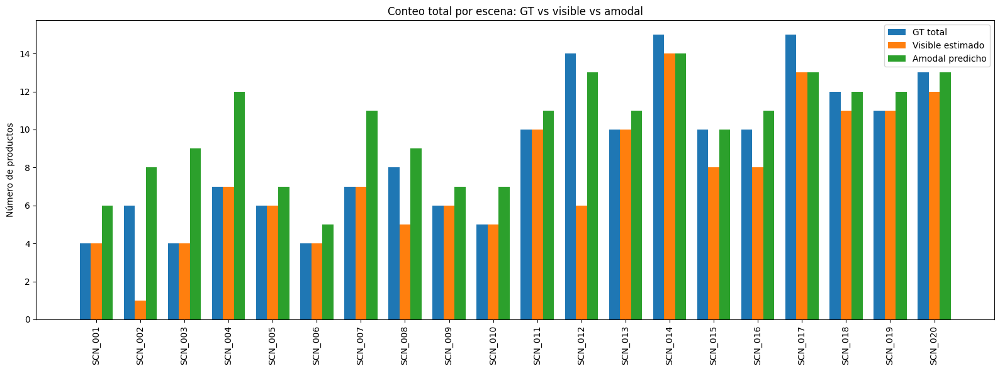

In [163]:
# ============================================================
# VISUALIZACIÓN 1: GT vs Visible vs Amodal
# ============================================================

N = min(20, len(amodal_eval))

plot_df = amodal_eval.head(N).copy()

x = np.arange(N)
width = 0.25

plt.figure(figsize=(16, 6))

plt.bar(
    x - width,
    plot_df["target_total_scene"],
    width,
    label="GT total"
)

plt.bar(
    x,
    plot_df["visible_total_est"],
    width,
    label="Visible estimado"
)

plt.bar(
    x + width,
    plot_df["amodal_total_pred"],
    width,
    label="Amodal predicho"
)

plt.xticks(
    x,
    plot_df["scene_id"],
    rotation=90
)

plt.ylabel("Número de productos")
plt.title("Conteo total por escena: GT vs visible vs amodal")
plt.legend()
plt.tight_layout()
plt.show()

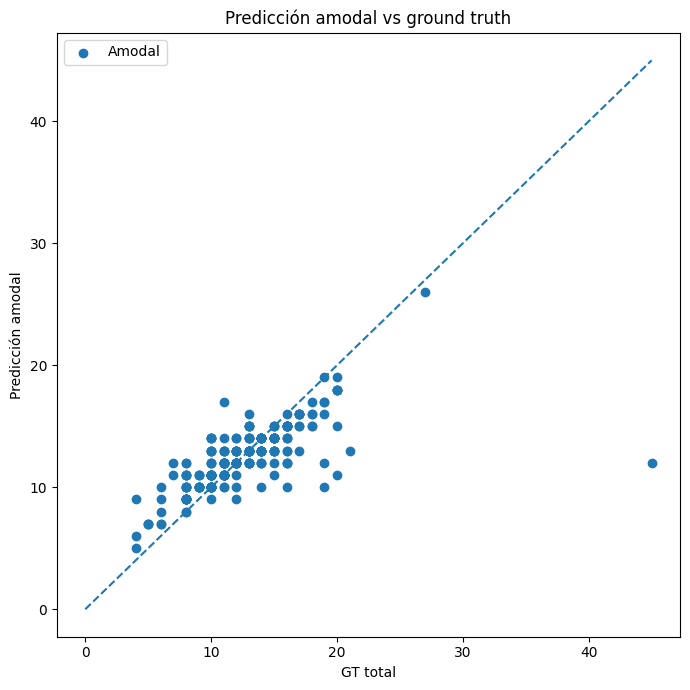

In [164]:
# ============================================================
# VISUALIZACIÓN 2: SCATTER GT vs PRED
# ============================================================

plt.figure(figsize=(7, 7))

plt.scatter(
    amodal_eval["target_total_scene"],
    amodal_eval["amodal_total_pred"],
    label="Amodal"
)

max_val = max(
    amodal_eval["target_total_scene"].max(),
    amodal_eval["amodal_total_pred"].max()
)

plt.plot(
    [0, max_val],
    [0, max_val],
    linestyle="--"
)

plt.xlabel("GT total")
plt.ylabel("Predicción amodal")
plt.title("Predicción amodal vs ground truth")
plt.legend()
plt.tight_layout()
plt.show()

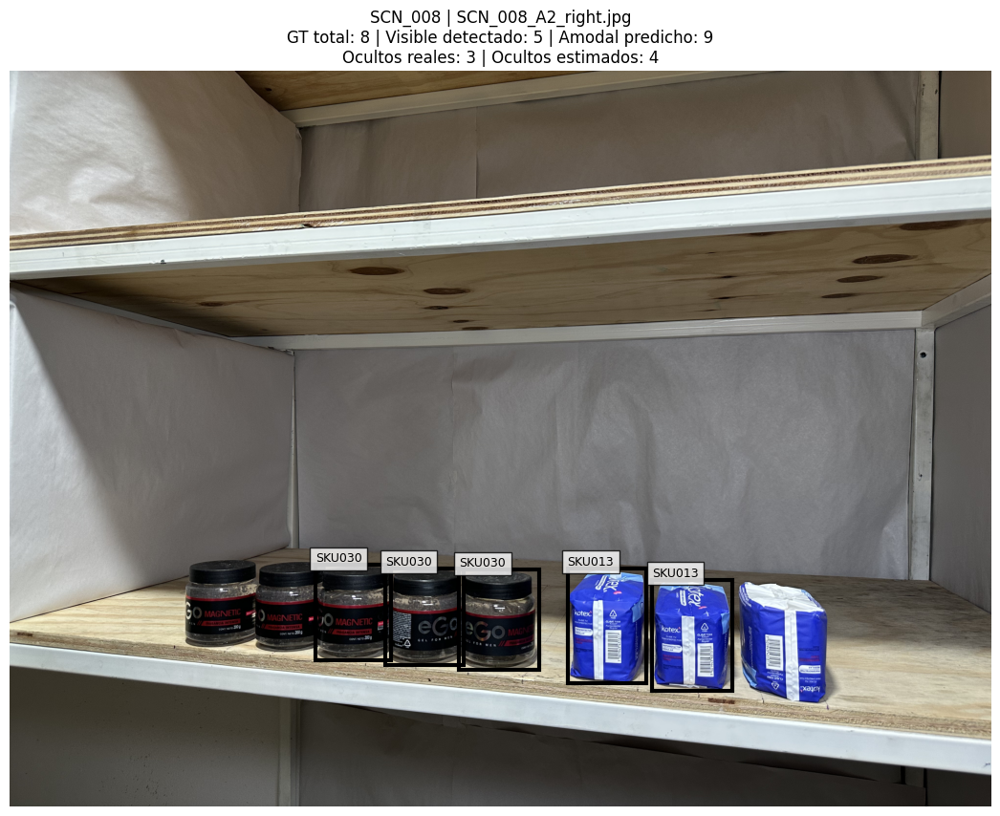

In [166]:
# ============================================================
# VISUALIZACIÓN 3: GRAFO DE UNA ESCENA
# ============================================================

def visualize_scene_visible_amodal(scene_id):

    dets = pred_df[
        pred_df["scene_id"] == scene_id
    ].copy()

    row = amodal_eval[
        amodal_eval["scene_id"] == scene_id
    ]

    if len(row) == 0:
        print("No existe en amodal_eval:", scene_id)
        return

    row = row.iloc[0]

    if len(dets) == 0:
        print("No hay detecciones visibles para:", scene_id)
        return

    best_view = (
        dets.groupby("scene")
        .size()
        .sort_values(ascending=False)
        .index[0]
    )

    dets_view = dets[
        dets["scene"] == best_view
    ].copy()

    image_path = os.path.join(
        SCENES_DIR,
        best_view
    )

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(14,10))
    plt.imshow(image)

    # ==========================
    # Dibujar detecciones visibles
    # ==========================

    for _, det in dets_view.iterrows():

        x1 = det["bbox_x1"]
        y1 = det["bbox_y1"]
        x2 = det["bbox_x2"]
        y2 = det["bbox_y2"]

        sku = det["predicted_sku"]

        plt.gca().add_patch(
            plt.Rectangle(
                (x1, y1),
                x2 - x1,
                y2 - y1,
                fill=False,
                linewidth=3
            )
        )

        plt.text(
            x1,
            y1 - 12,
            sku,
            fontsize=9,
            bbox=dict(
                facecolor="white",
                alpha=0.8
            )
        )

    # ==========================
    # Conteo amodal
    # ==========================

    gt_total = int(row["target_total_scene"])
    visible = int(row["visible_total_est"])
    amodal = int(row["amodal_total_pred"])
    hidden_pred = int(row["hidden_pred"])
    hidden_gt = int(row["hidden_gt"])

    title = (
        f"{scene_id} | {best_view}\n"
        f"GT total: {gt_total} | Visible detectado: {visible} | "
        f"Amodal predicho: {amodal}\n"
        f"Ocultos reales: {hidden_gt} | Ocultos estimados: {hidden_pred}"
    )

    plt.title(title)
    plt.axis("off")
    plt.show()

scene_id = "SCN_008"

visualize_scene_visible_amodal(scene_id)

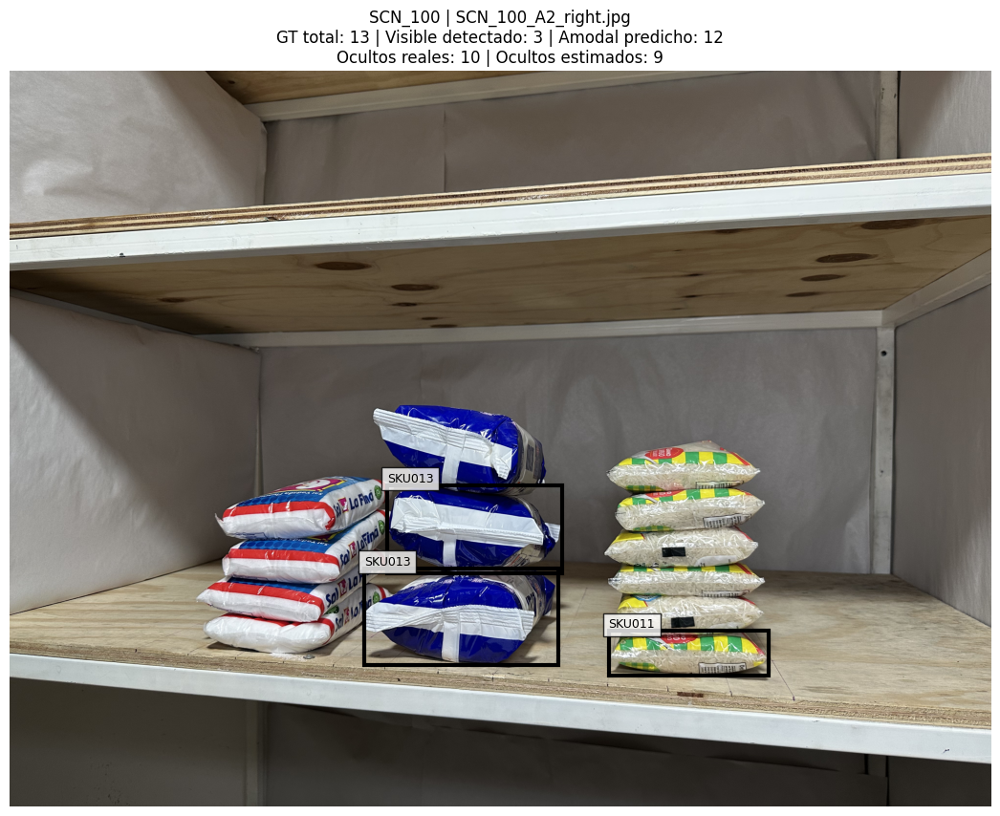

In [168]:
visualize_scene_visible_amodal("SCN_100")

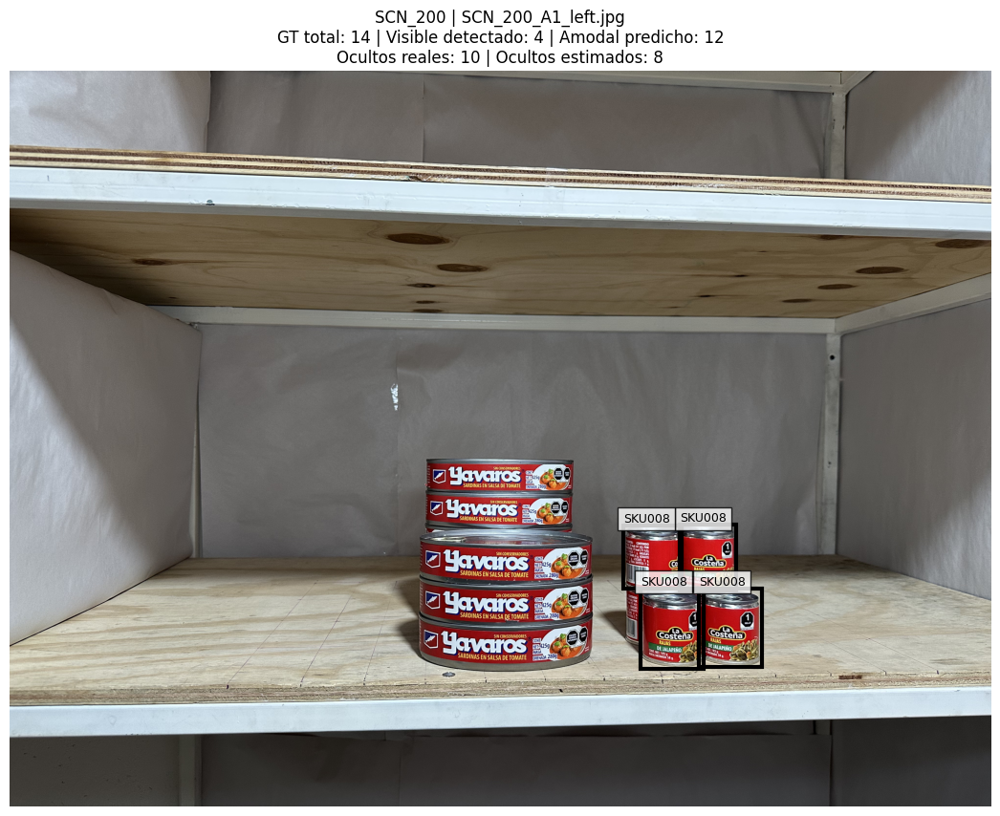

In [167]:
visualize_scene_visible_amodal("SCN_200")

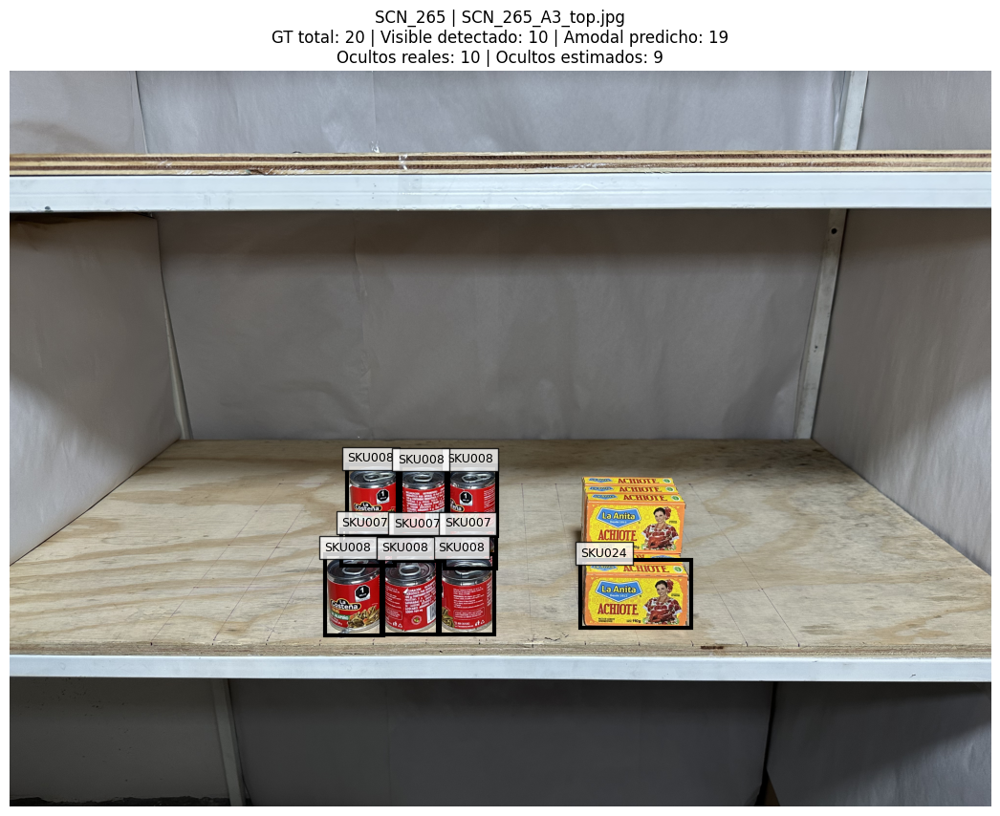

In [169]:
visualize_scene_visible_amodal("SCN_265")

# **Descargar archivos temporales**

In [ ]:
import os
from google.colab import files

# 1. Comprime toda la carpeta de contenidos temporales (excluyendo la de Drive si la tienes montada)
!zip -r archivos_temporales.zip /content/* -x "/content/drive/*"

# 2. Descarga el archivo zip generado
files.download('archivos_temporales.zip')

Se han truncado las últimas 5000 líneas del flujo de salida.
  adding: content/dataset_yolo_seg_mixed_v2/images/val/pseudo_SCN_077_A3_top.jpg (deflated 1%)
  adding: content/dataset_yolo_seg_mixed_v2/images/val/pseudo_SCN_156_A3_top.jpg (deflated 1%)
  adding: content/dataset_yolo_seg_mixed_v2/images/val/pseudo_SCN_125_A1_left.jpg (deflated 0%)
  adding: content/dataset_yolo_seg_mixed_v2/images/val/pseudo_SCN_262_A3_top.jpg (deflated 1%)
  adding: content/dataset_yolo_seg_mixed_v2/images/val/pseudo_SCN_031_A1_left.jpg (deflated 1%)
  adding: content/dataset_yolo_seg_mixed_v2/images/val/pseudo_SCN_148_A3_top.jpg (deflated 1%)
  adding: content/dataset_yolo_seg_mixed_v2/images/val/pseudo_SCN_031_A3_top.jpg (deflated 1%)
  adding: content/dataset_yolo_seg_mixed_v2/images/val/pseudo_SCN_196_A3_top.jpg (deflated 0%)
  adding: content/dataset_yolo_seg_mixed_v2/images/val/rf_SCN_228_A2_right_jpg.rf.11dAO9MZGHnyvTQJIjJw.jpg (deflated 0%)
  adding: content/dataset_yolo_seg_mixed_v2/images/val/p

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Insights y Hallazgos Preliminares**

### **1. Evolución de la Memory Bank**
***Intento 1: Imágenes de referencia individuales***

Inicialmente se construyó la memory bank utilizando únicamente imágenes de referencia de cada producto tomadas de frente. Aunque este enfoque permitió realizar las primeras pruebas de clasificación mediante embeddings DINOv2 y similitud coseno, se observó una capacidad limitada para generalizar a las condiciones reales del anaquel. Los productos presentes en las escenas presentan variaciones de iluminación, escala, orientación y oclusión que no estaban representadas en las imágenes de referencia.

**Insight:** Una memory bank compuesta únicamente por imágenes ideales de los productos no captura adecuadamente la variabilidad presente en escenarios reales.

***Intento 2: Imágenes de referencia y etiquetado Roboflow***

Posteriormente se incluyeron ejemplos provenientes del proceso de etiquetado realizado en Roboflow. Estos ejemplos fueron extraídos directamente de escenas reales, permitiendo incluir productos en diferentes posiciones y condiciones visuales.
Se observó una mejora en la identificación de productos, especialmente en aquellos que presentaban cambios de escala o ligeras variaciones de perspectiva.

**Insight:** El uso de ejemplos extraídos de escenas reales mejora significativamente la robustez de la clasificación respecto al uso exclusivo de imágenes de referencia.

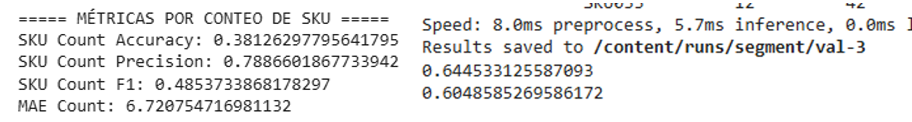


***Intento 3: Imágenes de referencia, Roboflow y Memory Bank adicional***

Finalmente se integró una memory bank adicional generada mediante el pipeline DINO - SAM2 - DINOv2, sumado a la clasificación manual de SKU’s a través de clusters, aumentando considerablemente el número de embeddings disponibles para cada SKU. Esta ampliación permitió representar una mayor diversidad visual de cada producto, incluyendo diferentes vistas, condiciones de iluminación y variaciones de segmentación.

**Insight:** Incrementar la diversidad visual dentro de la memory bank parece tener un impacto más importante que simplemente aumentar la cantidad de ejemplos idénticos de un producto.

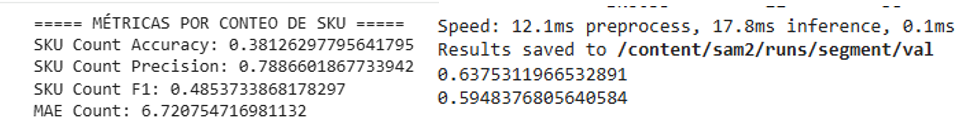


### **2. Comparación entre configuraciones de vistas**
Se evaluaron distintas combinaciones de vistas disponibles para cada escena:
- Vista frontal únicamente.

- Vista top y la vista lateral izquierda (520 imágenes).
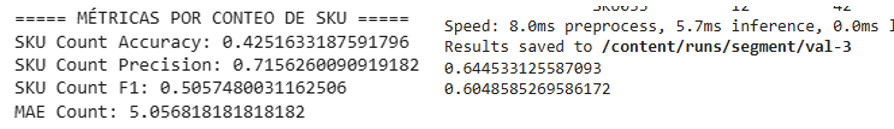
-	Vista top, lateral izquierda y lateral derecha (807 imágenes).
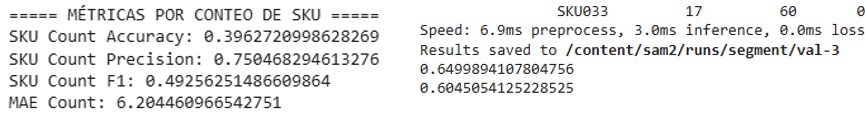

**Insight:** Las vistas laterales aportan información valiosa para inferir productos ocultos, pero requieren mecanismos de fusión de información entre vistas para aprovechar completamente su potencial.

*Métricas utilizadas:*


-	mAP50 dice si el modelo encuentra correctamente los productos.
-	mAP50-95 dice si además los segmenta con precisión.
-	SKU Count Accuracy mide el porcentaje de veces que el conteo predicho coincide exactamente con el conteo real de cada SKU.
-	SKU Count Precision mide qué proporción de los productos contados por el modelo realmente corresponden a productos presentes en la escena.
-	SKU Count F1-Score es una métrica que combina precisión y recall en un único valor.
-	MAE Count el MAE indica que, en promedio, el modelo se equivoca aproximadamente en varios productos por escena respecto al conteo real.

### **3. Hallazgos sobre detección y clasificación**
Durante las pruebas se observó que algunos productos visualmente idénticos son detectados correctamente mientras que otros no, incluso dentro de la misma imagen.
Las posibles causas identificadas son:

-	Diferencias de iluminación local.

-	Oclusiones parciales.

-	Variaciones en la calidad de segmentación generada por SAM2.

-	Productos muy cercanos entre sí.

-	Umbrales de confianza del detector.

-	Limitaciones del conjunto de entrenamiento utilizado por YOLO-Seg.

-	Perspectiva usada para la comparación (perspectiva del memory bank muy diferente a lo visto en las escenas).

**Insight:** El principal cuello de botella actual parece estar relacionado con no tener suficiente información para la detección de productos cuando se hace la comparación entre las imágenes de referencia y los productos observados en las escenas con diferentes perspectivas.


### **4. Comparación de Modelos para Conteo Amodal**
Con el objetivo de determinar qué tipo de modelo se adapta mejor al problema de conteo amodal, se evaluaron distintos algoritmos de regresión utilizando el mismo conjunto de características extraídas del pipeline de percepción. Los modelos evaluados fueron:

- **Dummy Regressor:** Se utilizó como línea base mínima de referencia. Este modelo simplemente predice el valor promedio observado durante el entrenamiento, sin considerar ninguna característica visual de entrada.

- **Random Forest:** Este modelo utiliza un conjunto de árboles de decisión para aprender relaciones no lineales entre las características visibles y el conteo total real. Entre sus ventajas se encuentra la capacidad de modelar interacciones complejas sin requerir grandes cantidades de datos ni un proceso intensivo de ajuste de hiperparámetros.

- **Gradient Boosting:** Este enfoque construye secuencialmente múltiples árboles de decisión, donde cada nuevo árbol intenta corregir los errores cometidos por los anteriores. Debido a esta estrategia iterativa, suele capturar patrones complejos con mayor precisión que un Random Forest convencional.

- **MLP (Multi-Layer Perceptron):** También se evaluó una red neuronal multicapa compuesta por varias capas densas, normalización de características y mecanismos de regularización para evitar sobreajuste. Este modelo busca aprender representaciones más complejas de las características visuales disponibles.

-	CORRIDA 520 IMÁGENES CON TOP Y LEFT:


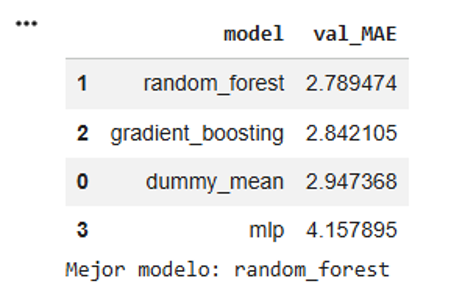





-  CORRIDA 520 IMÁGENES CON NUEVO MEMORY BANK CON TOP, LEFT Y RIGHT:

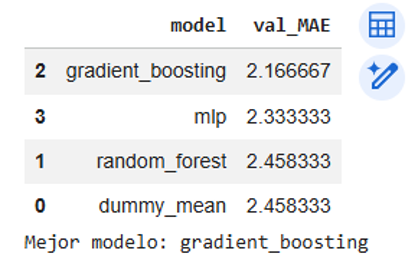




- CORRIDA 520 IMÁGENES CON NUEVO MEMORY BANK CON TOP Y LEFT:


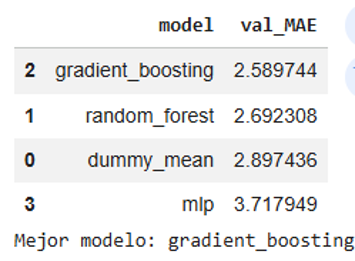



- CORRIDA 807 IMÁGENES CON NUEVO MEMORY BANK CON TOP, RIGHT Y LEFT:


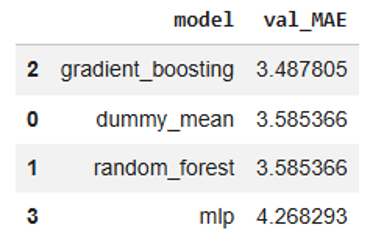





### **Próximos pasos identificados**
-	Mejorar la consistencia de detección de YOLO-Seg.en productos no detectados pertenecientes a un mismo tipo (gel de cabello, bote de aceitunas, etc)
-	Integrar la información proveniente de las vistas laterales dentro del modelo de conteo amodal.
-	Uso de aristas de productos en la inferencia de productos ocultos (parches).

# **Conclusión**

A lo largo de las diferentes iteraciones se observó que la calidad y diversidad de la memory bank tienen cierto impacto en el desempeño de la clasificación. Inicialmente, el uso exclusivo de imágenes de referencia individuales resultó insuficiente para representar la variabilidad visual presente en escenarios reales. La incorporación de ejemplos obtenidos mediante Roboflow y posteriormente de una memory bank adicional generada a partir de escenas reales permitió mejorar la robustez del sistema y ampliar la representación visual de los distintos SKU.

Tambien, analizamos distintas configuraciones de vistas, observándose que las imágenes laterales contienen información complementaria que puede resultar valiosa para inferir la presencia de productos ocultos. Sin embargo, también se identificó la necesidad de desarrollar mecanismos más avanzados para fusionar la información proveniente de múltiples perspectivas.

En la etapa de conteo amodal se evaluaron diversos modelos de regresión, incluyendo Dummy Regressor, Random Forest, Gradient Boosting y MLP. Los resultados mostraron que los modelos basados en árboles presentan un desempeño competitivo para el conjunto de características actualmente disponible.

De manera general, los resultados obtenidos demuestran que es posible estimar información más allá de los productos completamente visibles utilizando características derivadas de detección, segmentación y clasificación. No obstante, también se identificaron limitaciones importantes asociadas a la detección inconsistente de algunas instancias, la presencia de oclusiones complejas y la variabilidad visual entre escenas.

Como trabajo futuro se propone mejorar la calidad de las detecciones y segmentaciones, incorporar explícitamente información proveniente de múltiples vistas y explorar modelos especializados para razonamiento espacial y conteo amodal. Estas mejoras podrían permitir una estimación más precisa del inventario real presente en los anaqueles y acercar el sistema a aplicaciones reales de monitoreo y gestión de productos en entornos retail.
